# From Pixels to Diagnosis: Machine Learning Approaches for Tomato Leaf Disease Detection

## Pre-processing and General Statistics 

### Importing Libraries

The below code snippet imports necessary libraries and modules used in the project. Key libraries include TensorFlow for building and training the neural network, Matplotlib for plotting and visualization, and scikit-learn for evaluating model performance with metrics like confusion matrix and classification report. 

In [2]:
import os
import numpy as np
import pandas as pd
import tensorflow as tf
import matplotlib.pyplot as plt
import seaborn as sns
import json
import time
import csv

from sklearn.metrics import confusion_matrix, classification_report
from keras.utils.vis_utils import plot_model
from tensorflow.keras.utils import plot_model

from sklearn.metrics import roc_curve, auc
from itertools import cycle
from tensorflow.keras.models import load_model
from sklearn.metrics import precision_recall_curve, average_precision_score

import warnings
warnings.filterwarnings('ignore')

2024-10-02 22:21:54.402205: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-10-02 22:21:54.981707: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT


### Data Preparation

In [3]:
split_ratio = '80-10-10'

# Data Preparation
train_data_dir = f'Tomato_Leaves_Dataset/{split_ratio}/train'
valid_data_dir = f'Tomato_Leaves_Dataset/{split_ratio}/val'
test_data_dir = f'Tomato_Leaves_Dataset/{split_ratio}/test'

The code fragment above initializes the directory paths for the training, validation, and test datasets. These directories contain images of tomato leaves categorized into different classes (e.g., healthy and various diseases). This setup is crucial for organizing the data and feeding it into the model for training, validation, and testing.

### Data Augmentation and Preprocessing

In [4]:
train_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

valid_datagen = tf.keras.preprocessing.image.ImageDataGenerator(
    rescale=1/255.0,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True
)

test_datagen = tf.keras.preprocessing.image.ImageDataGenerator(rescale=1/255.0)

The code snippet above initializes data generators for training, validation, and testing datasets using TensorFlow's `ImageDataGenerator`. These generators are used to preprocess and augment image data before feeding it into a Convolutional Neural Network (CNN) model.

1. **Training Data Generator (`train_datagen`)**:
   - **Purpose**: To preprocess and augment the training images.
   - **Operations**: Rescales pixel values, and applies various augmentations (shear, zoom and horizontal flip) to artificially increase the diversity of the training dataset.

2. **Validation Data Generator (`valid_datagen`)**:
   - **Purpose**: To preprocess and augment validation images.
   - **Operations**: Rescales pixel values, and applies various augmentations (shear, zoom and horizontal flip) to artificially increase the diversity of the validation dataset.

3. **Testing Data Generator (`test_datagen`)**:
   - **Purpose**: To preprocess test images.
   - **Operations**: Only rescales pixel values to normalize the data.

#### Key Point

- **Rescaling (`rescale=1/255.0`)**: Images are typically represented in pixel values ranging from 0 to 255. Rescaling by **`1/255.0`** normalizes these values to a range between 0 and 1, which is a common preprocessing step to improve the performance and convergence speed of neural networks.

### Data Generators

In [5]:
train_gen = train_datagen.flow_from_directory(
    train_data_dir, 
    target_size=(224, 224), 
    batch_size=32, 
    shuffle=True, 
    class_mode='categorical')

Found 8800 images belonging to 10 classes.


In [6]:
val_gen = valid_datagen.flow_from_directory(
    valid_data_dir, 
    target_size=(224,224), 
    batch_size=32, 
    shuffle=True, 
    class_mode='categorical')

Found 1100 images belonging to 10 classes.


In [7]:
test_gen = test_datagen.flow_from_directory(
    test_data_dir, 
    target_size=(224, 224), 
    batch_size=32, 
    class_mode='categorical', 
    shuffle=False)

Found 1100 images belonging to 10 classes.


The above code snippets creates data generators for the training, validation, and test datasets. The **`flow_from_directory`** method is used to read images from the specified directories, resize them to 224x224 pixels, and process them in batches of 32. For the training and validation generators, images are shuffled to ensure random distribution during training. The class mode is set to 'categorical' to handle multi-class classification, while for the test generator, shuffling is disabled to preserve the order of predictions.

### Class Names

In [7]:
class_names = train_gen.class_indices
print("Class List:")
print("-" * 40)
for class_name, class_index in sorted(class_names.items(), key=lambda x: x[1]):
    print(f"Class [No.{class_index + 1:02d}]: {class_name.replace('_', ' ')}")
print("-" * 40)

Class List:
----------------------------------------
Class [No.01]: Tomato   Bacterial spot
Class [No.02]: Tomato   Early blight
Class [No.03]: Tomato   Late blight
Class [No.04]: Tomato   Leaf Mold
Class [No.05]: Tomato   Septoria leaf spot
Class [No.06]: Tomato   Spider mites Two-spotted spider mite
Class [No.07]: Tomato   Target Spot
Class [No.08]: Tomato   Tomato Yellow Leaf Curl Virus
Class [No.09]: Tomato   Tomato mosaic virus
Class [No.10]: Tomato   healthy
----------------------------------------


### Extract and Visualize One Image Per Class

The code snippet ahead extracts a single representative image for each class from a training data generator and visualizes them. It first retrieves the class indices from the generator and creates a mapping from indices to class names. Then, it iterates through the generator to collect one image per class, ensuring each class is represented. Finally, it plots these images with their corresponding class names in a grid layout. This process helps in understanding the distribution and representation of different classes in the dataset.

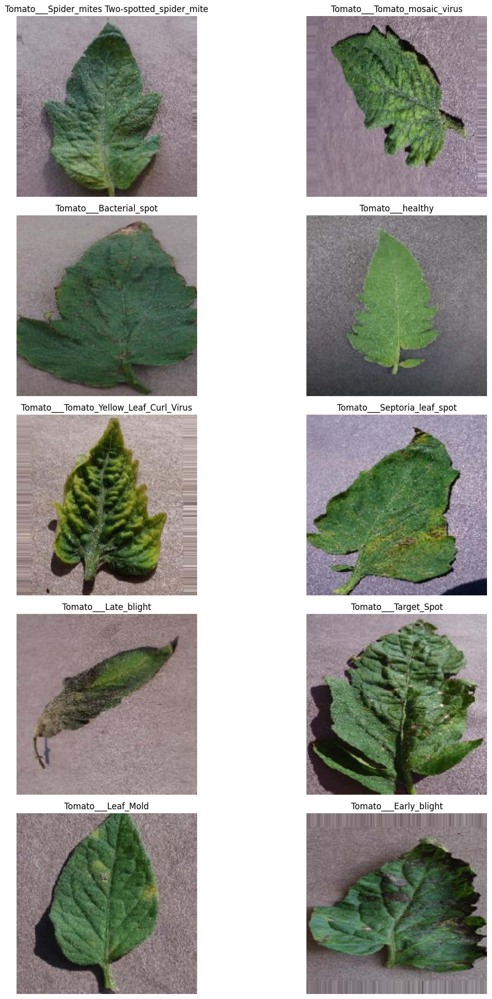

In [8]:
# Get class indices
class_indices = train_gen.class_indices

# Reverse the class indices to get the class names from indices
idx_to_class = {v: k for k, v in class_indices.items()}

# Initialize a dictionary to store one image per class
sample_images = {}

# Iterate through the generator to get one image per class
for images, labels in train_gen:
    for i in range(images.shape[0]):
        label_idx = np.argmax(labels[i])
        class_name = idx_to_class[label_idx]
        if class_name not in sample_images:
            sample_images[class_name] = images[i]
        # Break if we have collected one image for each class
        if len(sample_images) == len(class_indices):
            break
    if len(sample_images) == len(class_indices):
        break

# Plotting the images with class names
num_classes = len(sample_images)
num_cols = 2
num_rows = (num_classes + num_cols - 1) // num_cols  # Calculate number of rows needed

plt.figure(figsize=(14, 20))
for i, (class_name, image) in enumerate(sample_images.items()):
    plt.subplot(num_rows, num_cols, i + 1)
    plt.imshow(image)
    plt.title(class_name)
    plt.axis('off')

plt.tight_layout()
plt.show()

### Count Training Images per Class

In [33]:
diseases = os.listdir(train_data_dir)

# Number of images for each disease
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(train_data_dir + '/' + disease))
    
# Converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column
img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["Number of Images (Training Set)"])
img_per_class

,Number of Images (Training Set)
Tomato___Tomato_mosaic_virus,880
Tomato___Early_blight,880
Tomato___Late_blight,880
Tomato___Target_Spot,880
Tomato___Septoria_leaf_spot,880
Tomato___Bacterial_spot,880
Tomato___Tomato_Yellow_Leaf_Curl_Virus,880
Tomato___healthy,880
Tomato___Leaf_Mold,880
Tomato___Spider_mites Two-spotted_spider_mite,880


The snippet above lists all disease classes in the training directory, counts the number of images for each class, and converts the counts into a **pandas DataFrame**. This provides an overview of the distribution of training images across different classes.

### Count Testing/Validation Images per Class

In [34]:
diseases = os.listdir(valid_data_dir)

# Number of images for each disease
nums = {}
for disease in diseases:
    nums[disease] = len(os.listdir(valid_data_dir + '/' + disease))
    
# Converting the nums dictionary to pandas dataframe passing index as plant name and number of images as column
img_per_class = pd.DataFrame(nums.values(), index=nums.keys(), columns=["Number of Images (Validation/Testing Set)"])
img_per_class

,Number of Images (Validation/Testing Set)
Tomato___Tomato_mosaic_virus,110
Tomato___Early_blight,110
Tomato___Late_blight,110
Tomato___Target_Spot,110
Tomato___Septoria_leaf_spot,110
Tomato___Bacterial_spot,110
Tomato___Tomato_Yellow_Leaf_Curl_Virus,110
Tomato___healthy,110
Tomato___Leaf_Mold,110
Tomato___Spider_mites Two-spotted_spider_mite,110


The above snippet lists all disease classes in the validation/testing directory, counts the number of images for each class, and converts the counts into a **pandas DataFrame**. This provides an overview of the distribution of validation/testing images across different classes.

### Visualize and Analyze Dataset Distribution

In [11]:
# Function to get the number of images for each disease in a given directory
def get_image_counts(data_dir):
    diseases = os.listdir(data_dir)
    nums = {}
    for disease in diseases:
        nums[disease] = len(os.listdir(os.path.join(data_dir, disease)))
    return nums

This function **`get_image_counts`** takes a directory path as input and returns a dictionary where the keys are disease class names and the values are the number of images for each class in the specified directory.

In [12]:
# Get image counts for each set
train_counts = get_image_counts(train_data_dir)
test_counts = get_image_counts(test_data_dir)
val_counts = get_image_counts(valid_data_dir)

Having already defined the directories for the training, testing, and validation datasets. They then use the **get_image_counts** function to get the number of images for each class in these datasets.

In [13]:
# Calculate total number of images in each set
total_train_images = sum(train_counts.values())
total_test_images = sum(test_counts.values())
total_val_images = sum(val_counts.values())

# Create DataFrame for overall counts
overall_counts = pd.DataFrame({
    'Set': ['Training', 'Testing', 'Validation'],
    'Number of images': [total_train_images, total_test_images, total_val_images]
})


These lines calculate the total number of images in the training, testing, and validation sets. They then create a pandas DataFrame overall_counts that holds the total number of images for each dataset, which will be used for plotting.

In [14]:
# Function to format the number of images in pie chart labels
def absolute_value(val, total):
    return int(val / 100. * total)

# Function to plot pie charts
def plot_pie_charts(class_name):
    fig, axs = plt.subplots(2, 2, figsize=(14, 14), gridspec_kw={'width_ratios': [1, 1], 'height_ratios': [1, 1], 'wspace': 0.4, 'hspace': 0.4})
    
    # Plot overall counts donut chart
    axs[0, 0].pie(overall_counts['Number of images'], labels=overall_counts['Set'],
                  autopct=lambda p: '{:.0f}'.format(absolute_value(p, sum(overall_counts['Number of images']))),
                  startangle=140, wedgeprops=dict(width=0.3))
    axs[0, 0].set_title('Overall Number of Images per Set')

    # Create DataFrame for class counts within training set
    train_df = pd.DataFrame(train_counts.values(), index=train_counts.keys(), columns=["Number of images"])
    
    # Plot class counts pie chart for the training set
    axs[0, 1].pie(train_df['Number of images'], labels=train_df.index,
                  autopct=lambda p: '{:.0f}'.format(absolute_value(p, sum(train_df['Number of images']))), startangle=140)
    axs[0, 1].set_title('Number of Images per Class in Training Set')

    # Get image counts for the specific class across sets
    specific_class_counts = [
        train_counts.get(class_name, 0),
        test_counts.get(class_name, 0),
        val_counts.get(class_name, 0)
    ]
    
    # Create DataFrame for specific class counts
    specific_class_df = pd.DataFrame({
        'Set': ['Training', 'Testing', 'Validation'],
        'Number of images': specific_class_counts
    })
    
    # Plot specific class counts pie chart
    axs[1, 0].pie(specific_class_df['Number of images'], labels=specific_class_df['Set'],
                  autopct=lambda p: '{:.0f}'.format(absolute_value(p, sum(specific_class_df['Number of images']))),
                  startangle=140, wedgeprops=dict(width=0.3))
    axs[1, 0].set_title(f'Number of Images for each of Tomato classes per Set')

    # Create DataFrame for class counts within the test set
    test_df = pd.DataFrame(test_counts.values(), index=test_counts.keys(), columns=["Number of images"])

    # Plot class counts pie chart for the test set
    axs[1, 1].pie(test_df['Number of images'], labels=test_df.index,
               autopct=lambda p: '{:.0f}'.format(absolute_value(p, sum(test_df['Number of images']))), startangle=140)
    axs[1, 1].set_title('Number of Images per Class in Testing/Validation Set')

    # Hide the unused subplot
    axs[1, 1].axis('off')

    plt.show()

The **`absolute_value`** function formats pie chart labels to display the absolute number of images. 

The **`plot_pie_charts`** function initializes a 2x2 grid of subplots for various pie charts.

The first pie chart shows the total number of images in the training, testing, and validation sets. A DataFrame **`train_df`** is created to represent the number of images in each class within the training set, and a pie chart is plotted to show the distribution of images among these different classes. The function then retrieves the number of images for a specific class (e.g., 'Tomato___Bacterial_spot') across the training, testing, and validation sets, creating a DataFrame **`specific_class_df`** to plot a pie chart showing this distribution. This represents the distribution of the specified class across the datasets, divided into equal chunks. A DataFrame **`test_df`** is also created for the number of images in each class within the test set, with a corresponding pie chart to show the distribution of images among these classes. Finally, the unused subplot is hidden.

The following two lines set the class_name to '`Tomato___Bacterial_spot`' (or any other desired class) and call the **`plot_pie_charts`** function to generate the pie charts described above.

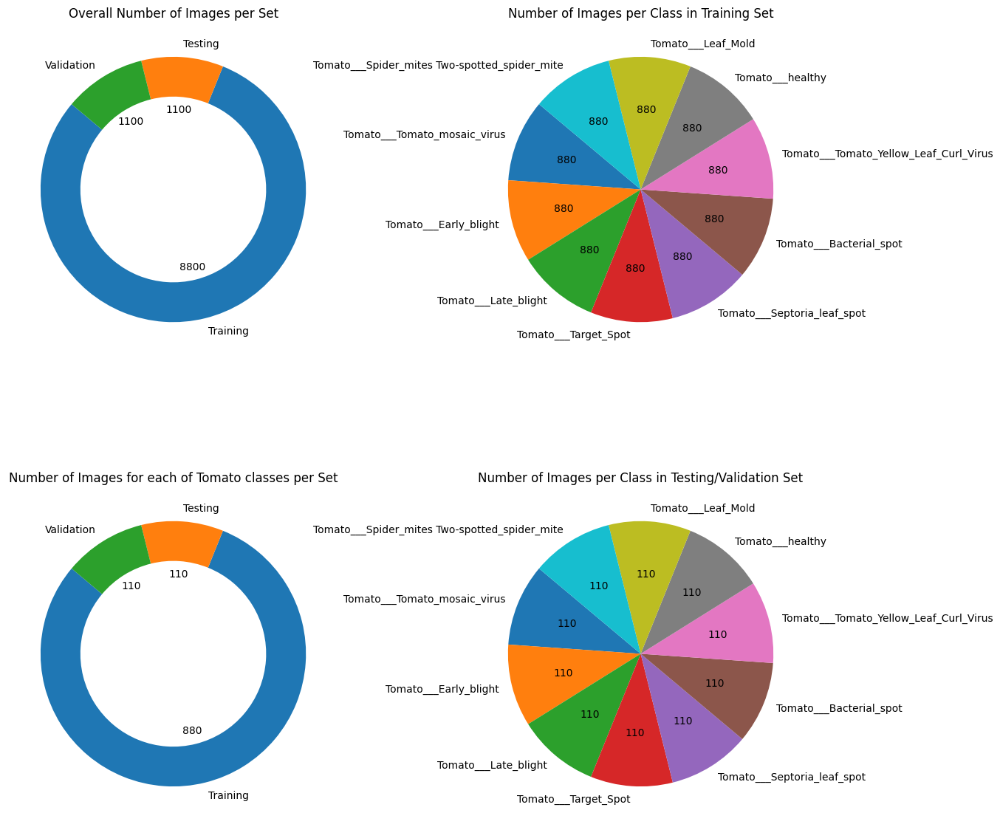

In [15]:
# Call the function with the desired class name
class_name = 'Tomato___Bacterial_spot'
plot_pie_charts(class_name)

### Visualize Image Distribution with Bar Chart

In [16]:
# Get image counts for each set
train_counts = get_image_counts(train_data_dir)
test_counts = get_image_counts(test_data_dir)
val_counts = get_image_counts(valid_data_dir)

In the above code snippet we are using the function we initialized earlier, where we get the number of images for each class in the datasets we are currently "working".

In [17]:
# Convert the counts to DataFrames
train_df = pd.DataFrame(train_counts.values(), index=train_counts.keys(), columns=["Train"])
test_df = pd.DataFrame(test_counts.values(), index=test_counts.keys(), columns=["Test"])
val_df = pd.DataFrame(val_counts.values(), index=val_counts.keys(), columns=["Validation"])

# Combine the DataFrames
img_per_class = pd.concat([train_df, test_df, val_df], axis=1).fillna(0)

# Reset index for easier plotting
img_per_class = img_per_class.reset_index().melt(id_vars='index', var_name='Set', value_name='Number of Images')
img_per_class = img_per_class.rename(columns={'index': 'Disease'})

These above lines convert the image counts for the training, testing, and validation sets into pandas DataFrames (**`train_df`**, **`test_df`**, **`val_df`**). They then combine these DataFrames into a single DataFrame (**`img_per_class`**) and transform it into a format suitable for plotting, where each row represents the number of images for a particular disease in a specific data set.

- **`concat`** and **`(axis=1)`**: Combine the DataFrames along the columns (axis=1) to create a single DataFrame with counts for training, testing, and validation sets side by side.
- **`reset_index()`**: Converts the index (disease names) into a regular column.
- **`melt()`**: Transforms the DataFrame so that each row represents a single count for a specific disease and set (training, testing, or validation).
- **`rename(columns={'index': 'Disease'})`**: Renames the 'index' column to 'Disease'.

The following code snippet create a stacked horizontal bar chart to visualize the distribution of images per disease class across the training, testing, and validation sets. It uses Seaborn's **`barplot`** function to plot the data and customizes the appearance of the plot with titles and labels for better readability. The **`plt.show()`** function is called to display the plot.

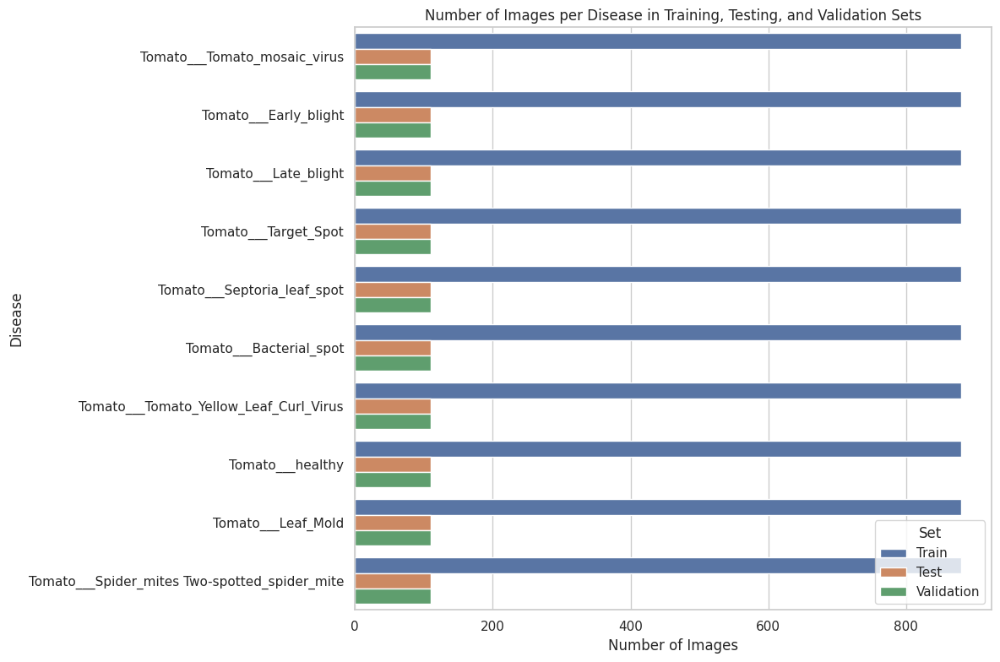

In [18]:
# Create a stacked horizontal bar chart
plt.figure(figsize=(12, 8))
sns.set(style="whitegrid")

# Plotting the bar chart
sns.barplot(data=img_per_class, x='Number of Images', y='Disease', hue='Set', orient='h')

# Customizing the plot
plt.title('Number of Images per Disease in Training, Testing, and Validation Sets')
plt.xlabel('Number of Images')
plt.ylabel('Disease')
plt.legend(title='Set')
plt.tight_layout()

# Show plot
plt.show()

## Reusable Functions Used by Each Model

### Evaluate and Store Model Results

This function evaluates a given model on the training, validation, and test datasets, and stores the results (loss and accuracy) in a dictionary. It helps to consistently capture the performance metrics across different models.

In [ ]:
# Function to evaluate model on each set and stores the results in a dictionary for future and further analysis
def evaluate_and_store_results(model, train_gen, val_gen, test_gen, model_name):
    """
    Evaluates a model on training, validation, and test data and stores the results in a dictionary.

    Args:
        model: The trained model to evaluate (e.g., cnn, VGG16_model, VGG19_model).
        train_gen: The training data generator.
        val_gen: The validation data generator.
        test_gen: The test data generator.
        model_name: A string representing the model name (e.g., 'cnn', 'vgg16', 'vgg19').

    Returns:
        A dictionary containing the loss and accuracy for training, validation, and test datasets.
    """
    
    # Evaluating model on training data
    train_loss, train_acc = model.evaluate(train_gen)
    print(f'[{model_name.upper()}] Training loss:', train_loss)
    print(f'[{model_name.upper()}] Training accuracy:', train_acc)
    print()
    
    # Evaluating model on validation data
    val_loss, val_acc = model.evaluate(val_gen)
    print(f'[{model_name.upper()}] Validation loss:', val_loss)
    print(f'[{model_name.upper()}] Validation accuracy:', val_acc)
    print()
    
    # Evaluating model on test data
    test_loss, test_acc = model.evaluate(test_gen)
    print(f'[{model_name.upper()}] Testing loss:', test_loss)
    print(f'[{model_name.upper()}] Testing accuracy:', test_acc)
    
    # Storing the evaluation results into a dictionary
    results = {
        "train_loss": train_loss,
        "val_loss": val_loss,
        "test_loss": test_loss,
        "train_acc": train_acc,
        "val_acc": val_acc,
        "test_acc": test_acc
    }
    
    return results


### Plotting Training and Validation Metrics

The following code fragment plots the training and validation loss and accuracy over epochs. This helps to visualize the model's learning process and identify potential issues like overfitting or underfitting.

In [ ]:
# Reusable function to plot training and validation metrics for different models
def plot_model_history(history, model_name):
    """
    Plots the training and validation loss and accuracy for the specified model.
    
    Args:
    - history: The history object containing training metrics (e.g., loss, accuracy).
    - model_name: The name of the model (used in titles and labels).
    
    This function generates two subplots:
    - Loss vs Epochs (Training and Validation)
    - Accuracy vs Epochs (Training and Validation)
    """
    
    # Create subplots
    fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))
    
    # Plot loss
    ax1.plot(history['loss'], label='Training loss', color='blue')
    ax1.plot(history['val_loss'], label='Validation loss', color='orange')
    ax1.set_xlabel('Epochs')
    ax1.set_ylabel('Loss')
    ax1.set_title(f'{model_name} Training and Validation Loss')
    ax1.legend()
    ax1.grid(True)

    # Plot accuracy
    ax2.plot(history['accuracy'], label='Training accuracy', color='blue')
    ax2.plot(history['val_accuracy'], label='Validation accuracy', color='orange')
    ax2.set_xlabel('Epochs')
    ax2.set_ylabel('Accuracy')
    ax2.set_title(f'{model_name} Training and Validation Accuracy')
    ax2.legend()
    ax2.grid(True)

    # Adjust layout and add space between the plots
    plt.tight_layout()
    plt.subplots_adjust(hspace=0.4)

    # Display the plots
    plt.show()

### Visualize Training, Validation, and Testing Loss and Accuracy

The below code snippet visualizes the losses and accuracies for the training, validation, and testing sets. It creates a bar chart with side-by-side bars for loss and accuracy for each set. The chart provides a clear comparison of the model's performance across the different datasets.

In [ ]:
# Function to plot losses and accuracies for a given model based on the results dictionary
def plot_losses_accuracies(results, model_name):
    """
    Plots the losses and accuracies for training, validation, and test sets for a given model.

    Args:
    - results: Dictionary containing the train, validation, and test loss and accuracy metrics.
               Example format: {'train_loss': ..., 'val_loss': ..., 'test_loss': ..., 'train_acc': ..., 'val_acc': ..., 'test_acc': ...}
    - model_name: The name of the model (used in the plot title).

    This function generates a bar chart comparing loss and accuracy for training, validation, and test sets.
    """
    
    # Extract data from the results dictionary
    losses = [results['train_loss'], results['val_loss'], results['test_loss']]
    accuracies = [results['train_acc'], results['val_acc'], results['test_acc']]
    labels = ['Train', 'Validation', 'Test']

    # Plotting losses and accuracies together
    fig, ax = plt.subplots(figsize=(10, 6))

    x = np.arange(len(labels))
    width = 0.35

    bars1 = ax.bar(x - width/2, losses, width, label='Loss', color='lightcoral')
    bars2 = ax.bar(x + width/2, accuracies, width, label='Accuracy', color='lightgreen')

    ax.set_xlabel('Set')
    ax.set_ylabel('Values')
    ax.set_title(f'{model_name}: Losses and Accuracies for Training, Validation, and Testing Sets')
    ax.set_xticks(x)
    ax.set_xticklabels(labels)
    ax.legend()

    # Annotating the bars with the values
    def add_labels(bars, value_format):
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{value_format % height}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    add_labels(bars1, "%.2f")
    add_labels(bars2, "%.2f")

    plt.show()

### Model Evaluation and Prediction on Test Dataset

This function evaluates a given trained model on the provided test dataset and returns predicted classes, true classes, and class labels. It abstracts the evaluation logic, making it reusable for different models.

In [ ]:
# Function to evaluate model's prediction on test data
def evaluate_model(model, test_gen):
    """
    Evaluates a model on a test dataset and returns the predicted and true classes.

    Args:
        model: The trained model (cnn, VGG16_model, or VGG19_model).
        test_gen: The test data generator.

    Returns:
        predicted_classes: The predicted class indices for the test data.
        true_classes: The ground-truth class indices for the test data.
        class_labels: The list of class labels corresponding to the indices.
    """
    # Common initialization (only done once)
    test_steps_per_epoch = np.math.ceil(test_gen.samples / test_gen.batch_size)
    true_classes = test_gen.classes
    class_labels = list(test_gen.class_indices.keys())
    
    # Predict using the provided model
    predictions = model.predict(test_gen, steps=test_steps_per_epoch)
    predicted_classes = np.argmax(predictions, axis=1)
    
    return predictions, predicted_classes, true_classes, class_labels

   - **`test_gen.classes`**: This attribute of the test data generator contains the true class indices for each sample in the test set. It is a 1D array where each element is the integer index of the true class for the corresponding sample.
   - **Purpose**: To compare the model’s predictions against the actual labels, you need the true class labels.
   - **Output**: The `true_classes` variable will be a 1D array of the true class indices for the samples in the test set.

   - **`test_gen.class_indices`**: This attribute is a dictionary mapping class names (as keys) to their corresponding indices (as values).
   - **`.keys()`**: This method returns a view object that displays a list of all the keys (class names) in the dictionary.
   - **`list(...)`**: Converts the view object into a list.
   - **Purpose**: To have a list of class names (labels) that correspond to the indices. This is useful for interpreting the predicted and true class indices.
   - **Output**: The `class_labels` variable will be a list of class names, where the index of each name in the list corresponds to its class index.

- **`model.predict`**: This method generates output predictions for the input samples from the test data generator (**`test_gen`**).
- **`test_gen`**: This is our test data generator, which provides the batches of test images to the model.
- **`steps=test_steps_per_epoch`**: This specifies the total number of steps (batches of samples) to yield from the generator before stopping the prediction process. It's typically the total number of samples in the test set divided by the batch size.
- **Output**: The **`predictions`** variable will contain the predicted probabilities for each class for every sample in the test set. It will be a 2D array where each row corresponds to a sample and each column corresponds to a class, containing the probability that the sample belongs to that class.

- **`np.argmax(predictions, axis=1)`**: This function returns the indices of the maximum values along an axis. Here, **`axis=1`** specifies that it should find the index of the maximum value in each row of the **`predictions`** array.
- **Purpose**: Since each row in **`predictions`** contains the predicted probabilities for each class, **`np.argmax`** gives the index of the class with the highest probability for each sample, effectively predicting the class label for each sample.
- **Output**: The **`predicted_classes`** variable will be a 1D array containing the predicted class indices for each sample in the test set.

### Computing and Plotting Confusion Matrix

The above code fragment computes the confusion matrix, which shows the number of correct and incorrect predictions for each class. This helps to visualize the performance of the classification model. Additionally it plots it using a heatmap for better visualization. The plot shows how often each class was correctly or incorrectly predicted.

In [ ]:
# Function to plot the confusion matrix for a given model
def plot_confusion_matrix(true_classes, predicted_classes, class_labels, model_name):
    """
    Computes and plots the confusion matrix for a given classification model.

    Args:
    - true_classes: Array of true class labels.
    - predicted_classes: Array of predicted class labels.
    - class_labels: List of class names corresponding to class indices.
    - model_name: The name of the model (used in the plot title).

    This function generates a heatmap of the confusion matrix to visualize the performance of the model.
    """
    
    # Compute confusion matrix
    conf_matrix = confusion_matrix(true_classes, predicted_classes)

    # Plot confusion matrix
    plt.figure(figsize=(10, 7))
    heatmap = sns.heatmap(conf_matrix, annot=True, fmt='d', cmap='Blues', 
                          xticklabels=class_labels, yticklabels=class_labels)

    # Set font size of tick labels
    heatmap.set_xticklabels(heatmap.get_xticklabels(), rotation=90, horizontalalignment='right', fontsize=9)
    heatmap.set_yticklabels(heatmap.get_yticklabels(), rotation=0, fontsize=7)

    plt.xlabel('Predicted Labels')
    plt.ylabel('True Labels')
    plt.title(f'Confusion Matrix for {model_name}')
    plt.show()

### Precision-Recall curves

The following code snippet is used to evaluate the performance of our multi-class classification model by generating and plotting Precision-Recall (PR) curves for each class.

It calculates the precision, recall, and average precision score for each class by comparing the true labels (**`true_classes`**) with the predicted probabilities (**`predictions`**) for that class. The Precision-Recall curve shows the trade-off between precision (the proportion of true positive predictions among all positive predictions) and recall (the proportion of true positives identified among all actual positives) across different thresholds. The average precision score provides a summary of the PR curve.

After computing these metrics, the code plots a separate PR curve for each class, displaying how well the model distinguishes between each class and the others, and showing the area under the PR curve (average precision) as a measure of performance.

In [ ]:
# Function to plot Precision-Recall curves for a given model
def plot_precision_recall_curves(true_classes, predictions, class_labels, model_name):
    """
    Plots the Precision-Recall curves for each class in a classification problem for a given model.

    Args:
    - true_classes: Array of true class labels (one-hot encoded or integer labels).
    - predictions: Array of predicted probabilities for each class.
    - class_labels: List of class names corresponding to class indices.
    - model_name: The name of the model (used in the plot titles).

    This function generates a Precision-Recall curve for each class in the classification task.
    """

    precision = {}
    recall = {}
    average_precision = {}

    # Compute precision, recall, and average precision for each class
    for i in range(len(class_labels)):
        precision[i], recall[i], _ = precision_recall_curve(true_classes == i, predictions[:, i])
        average_precision[i] = average_precision_score(true_classes == i, predictions[:, i])

    # Plot Precision-Recall curve for each class
    for i in range(len(class_labels)):
        plt.figure()
        plt.plot(recall[i], precision[i], label=f'Precision-Recall curve (AP = {average_precision[i]:0.2f})')
        plt.xlabel('Recall')
        plt.ylabel('Precision')
        plt.title(f'{model_name} - Precision-Recall Curve for class {class_labels[i]}')
        plt.legend(loc="best")
        plt.show()

### Misclassification Analysis

This code snippet identifies and visualizes misclassified images from the test dataset in our classification task. It does the following:

1. **Identifying Misclassified Images:** It locates the indices where the model's predicted classes differ from the true classes.

1. **Retrieving Misclassified Images:** For each misclassified index, it calculates the batch and image index within the batch, retrieves the corresponding image and true label, and determines the predicted label.

1. **Image Rescaling:** As the image data are normalized to a [0, 1] range, it rescales the pixel values back to the [0, 255] range and ensures the image is in the correct format for display.

1. **Displaying Images:** It plots the misclassified images in a grid with two images per row. Each image's true label is displayed above the predicted label, helping to visually assess where and how the model made errors.

This code is useful for debugging and understanding the types of mistakes a classification model makes, providing insights into specific cases where the model's predictions do not match the true labels.

In [ ]:
# Function to plot misclassified images for a given model
def plot_misclassified_images(predicted_classes, true_classes, test_gen, class_labels, model_name, num_images=10):
    """
    Plots the misclassified images along with their true and predicted labels.

    Args:
    - predicted_classes: Array of predicted class indices.
    - true_classes: Array of true class indices (one-hot encoded).
    - test_gen: The test data generator used for retrieving images and labels.
    - class_labels: List of class names corresponding to class indices.
    - model_name: Name of the model (for the plot title).
    - num_images: Number of misclassified images to display (default is 10).

    This function identifies the misclassified images and displays them with their true and predicted labels.
    """

    # Find misclassified indices
    misclassified_indices = np.where(predicted_classes != true_classes)[0]

    for i in range(min(num_images, len(misclassified_indices))):  # Display up to num_images
        idx = misclassified_indices[i]

        # Calculate the batch index and image index within the batch
        batch_idx = idx // test_gen.batch_size
        image_idx = idx % test_gen.batch_size

        # Get the batch of images and labels
        batch_images, batch_labels = test_gen[batch_idx]

        # Get the specific image and labels from the batch
        image = batch_images[image_idx]
        true_label = batch_labels[image_idx]
        predicted_label = predicted_classes[idx]

        # Rescale image values from [0, 1] to [0, 255] if needed
        if np.max(image) <= 1.0:
            image = image * 255.0

        # Ensure image is in uint8 format
        image = image.astype(np.uint8)

        # Display the misclassified image
        plt.figure()
        plt.imshow(image)
        plt.title(f'{model_name} - True: {class_labels[np.argmax(true_label)]}, Predicted: {class_labels[predicted_label]}')
        plt.axis('off')
        plt.show()

### ROC Curve for Each Class

ROC curves show the true positive rate vs. the false positive rate for each class, giving a visual representation of the model's performance. The Area Under the Curve (AUC) is also calculated and displayed for each class.

In [ ]:
# Function to plot ROC curves for a given model
def plot_roc_curves(true_classes, predictions, class_labels, model_name):
    """
    Plots the ROC curves for each class in a classification problem for a given model.

    Args:
    - true_classes: Array of true class labels (one-hot encoded or integer labels).
    - predictions: Array of predicted probabilities for each class.
    - class_labels: List of class names corresponding to class indices.
    - model_name: The name of the model (used in the plot titles).

    This function generates an ROC curve for each class in the classification task and computes the AUC.
    """
    
    fpr = {}
    tpr = {}
    roc_auc = {}

    # Line styles and color cycle for plotting multiple classes
    colors = cycle(['blue', 'green', 'red', 'cyan', 'magenta', 'yellow', 'black'])
    linestyles = cycle(['-', '--', '-.', ':'])

    # Compute ROC curve and ROC area for each class
    for i in range(len(class_labels)):
        fpr[i], tpr[i], _ = roc_curve(true_classes == i, predictions[:, i])
        roc_auc[i] = auc(fpr[i], tpr[i])

    # Create figure with larger size
    plt.figure(figsize=(8, 6))

    # Plot ROC curve for each class
    for i, color, ls in zip(range(len(class_labels)), colors, linestyles):
        plt.plot(fpr[i], tpr[i], color=color, linestyle=ls, lw=2, 
                 label=f'Class {class_labels[i]} (AUC = {roc_auc[i]:0.2f})')

    # Plot the diagonal line for random guessing
    plt.plot([0, 1], [0, 1], 'k--', lw=2, label='Random Guessing')

    # Set plot limits
    plt.xlim([0.0, 1.0])
    plt.ylim([0.0, 1.05])

    # Add axis labels and title
    plt.xlabel('False Positive Rate', fontsize=14)
    plt.ylabel('True Positive Rate', fontsize=14)
    plt.title(f'{model_name} - ROC Curve for Each Class', fontsize=16)

    # Improve aesthetics: legend, grid, and ticks
    plt.legend(loc="lower right", fontsize=12)
    plt.grid(True, linestyle='--', alpha=0.7)
    plt.xticks(np.arange(0, 1.1, step=0.1), fontsize=12)
    plt.yticks(np.arange(0, 1.1, step=0.1), fontsize=12)

    # Add tighter layout and show the plot
    plt.tight_layout()
    plt.show()

## Convolutional Neural Network (CNN) from scratch

### [CNN] Model Architecture

The below code snipepts defines the architecture of the Convolutional Neural Network (CNN) using TensorFlow's Keras API. It consists of multiple convolutional layers followed by max pooling layers, flattening, and dense layers. The output layer uses a softmax activation function to classify the input images into one of ten classes (nine diseases and one healthy class).

In [17]:
# CNN model layers
cnn = tf.keras.models.Sequential()

In [18]:
cnn.add(tf.keras.layers.Conv2D (filters=32, kernel_size = (3,3), activation='relu', input_shape = [224, 224,3])),
cnn.add(tf.keras.layers.MaxPooling2D(pool_size = (2, 2))),

(None,)

**At this stage, the model might detect edges around the tomato leaf, identifying the basic outline of the leaf, veins, or any color shifts that may indicate disease spots. This is the first layer, so it's primarily focused on detecting simple features like edges, shapes, and boundaries.**

In [19]:
cnn.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3,3), activation='relu')),
cnn.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2))),

(None,)

**The model might now detect patterns specific to diseases, such as discolored spots, mold growth, or leaf deformation, as these features are more subtle and complex than simple edges. This layer begins to capture more detailed aspects of the leaf.**

In [20]:
cnn.add(tf.keras.layers.Conv2D (filters=64, kernel_size=(3,3), activation='relu')),
cnn.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2))),

(None,)

**The model could now start differentiating between small lesions or subtle color differences between different diseases. It starts to learn specific patterns that distinguish different tomato diseases from each other.**

In [21]:
cnn.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu')), 
cnn.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2))),

(None,)

**By this stage, the model may recognize specific textures like fungal growth, tiny dark spots, or bacterial clusters that are key indicators of certain tomato diseases. The model is now handling more complex patterns tied to specific diseases.**

In [22]:
cnn.add(tf.keras.layers.Conv2D (filters=64, kernel_size=(3, 3), activation='relu')), 
cnn.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2))),

(None,)

**The model might recognize disease-specific patterns like viral spots, leaf necrosis, or distinct fungal arrangements. At this point, it can differentiate between types of damage or disease symptoms more clearly.**

In [23]:
cnn.add(tf.keras.layers.Conv2D(filters=64, kernel_size=(3, 3), activation='relu')), 
cnn.add(tf.keras.layers.MaxPooling2D(pool_size=(2, 2))),

(None,)

**At this final stage, the model is fine-tuning its understanding of specific, highly detailed features, such as the exact shape and color variation of lesions or the precise texture and spread of fungal infections. It focuses on the most subtle yet distinct patterns that will enable it to make an accurate classification between the different diseases.**

In [24]:
cnn.add(tf.keras.layers.Flatten()),

cnn.add(tf.keras.layers.Dense(units=64, activation='relu'))

# Output layer
cnn.add(tf.keras.layers.Dense(units=10, activation='softmax'))

The **Softmax** function is a generalization of the Sigmoid function for multi-class classification problems. It takes a vector of real-valued numbers as input and outputs a probability distribution over a set of classes.

**Key Characteristics of Softmax:**

   - Maps input to a probability distribution over multiple classes 
   - Used for multi-class classification problems 
   - Produces a vector of output values, where each value represents the probability of belonging to a particular class. Can be used as an output layer for multi-class classification tasks.

### [CNN] Model Compilation

In [25]:
cnn.compile(optimizer=tf.keras.optimizers.Adam(
    learning_rate=0.001),loss='categorical_crossentropy',metrics=['accuracy'])

The preceding code snippet compiles the CNN model using the Adam optimizer which is efficient and well-suited for handling large datasets and high-dimensional parameter spaces. The categorical cross-entropy loss is appropriate for our multi-class classification problem, and accuracy is a standard evaluation metric for classification tasks.

In [17]:
# Print model summary to get layer names
cnn.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 222, 222, 32)      896       
                                                                 
 max_pooling2d (MaxPooling2D  (None, 111, 111, 32)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 109, 109, 64)      18496     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 54, 54, 64)       0         
 2D)                                                             
                                                                 
 conv2d_2 (Conv2D)           (None, 52, 52, 64)        36928     
                                                                 
 max_pooling2d_2 (MaxPooling  (None, 26, 26, 64)       0

### [CNN] Model Architecture Visualization

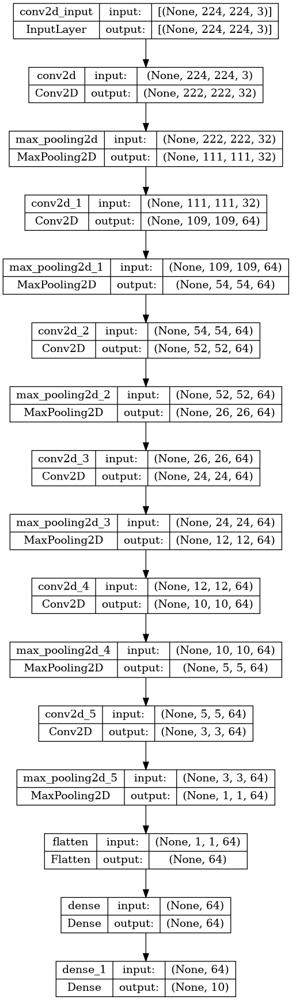

In [40]:
plot_model(cnn, to_file='CNN_model_plot.png', show_shapes=True, show_layer_names=True)

### [CNN] Additional Visualization of CNN Model Architecture

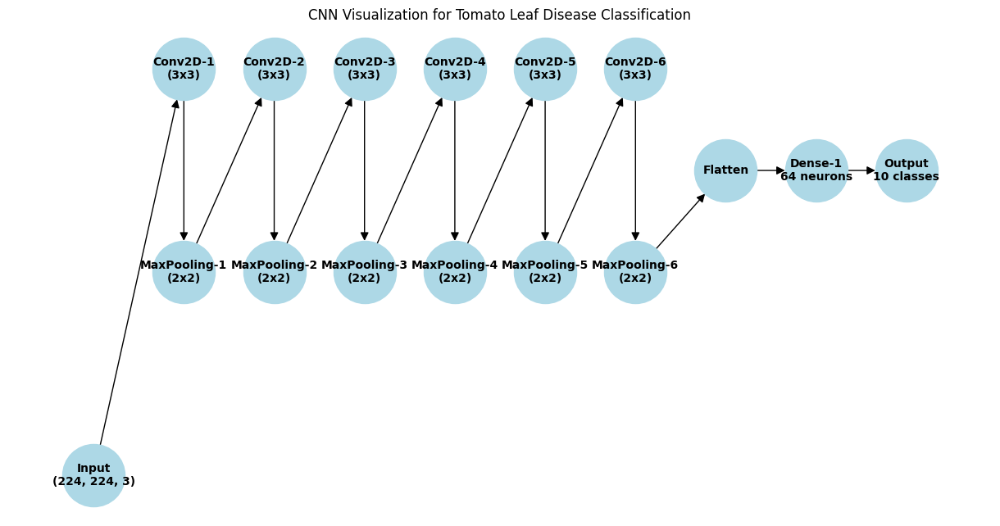

In [20]:
import matplotlib.pyplot as plt
import networkx as nx

# Create a directed graph to represent the CNN
G = nx.DiGraph()

# Adding nodes for input layer
G.add_node("Input\n(224, 224, 3)", layer="input")

# Adding nodes for Conv2D + MaxPooling layers
for i in range(1, 7):
    G.add_node(f"Conv2D-{i}\n(3x3)", layer=f"conv{i}")
    G.add_node(f"MaxPooling-{i}\n(2x2)", layer=f"pool{i}")
    if i == 1:
        G.add_edge("Input\n(224, 224, 3)", f"Conv2D-{i}\n(3x3)")
    else:
        G.add_edge(f"MaxPooling-{i-1}\n(2x2)", f"Conv2D-{i}\n(3x3)")
    G.add_edge(f"Conv2D-{i}\n(3x3)", f"MaxPooling-{i}\n(2x2)")

# Adding Flatten Layer
G.add_node("Flatten", layer="flatten")
G.add_edge("MaxPooling-6\n(2x2)", "Flatten")

# Adding Dense Layer
G.add_node("Dense-1\n64 neurons", layer="dense1")
G.add_edge("Flatten", "Dense-1\n64 neurons")

# Adding Output Layer
G.add_node("Output\n10 classes", layer="output")
G.add_edge("Dense-1\n64 neurons", "Output\n10 classes")

# Position nodes in layers
pos = {
    "Input\n(224, 224, 3)": (0, 0),
    "Conv2D-1\n(3x3)": (1, 2), "MaxPooling-1\n(2x2)": (1, 1),
    "Conv2D-2\n(3x3)": (2, 2), "MaxPooling-2\n(2x2)": (2, 1),
    "Conv2D-3\n(3x3)": (3, 2), "MaxPooling-3\n(2x2)": (3, 1),
    "Conv2D-4\n(3x3)": (4, 2), "MaxPooling-4\n(2x2)": (4, 1),
    "Conv2D-5\n(3x3)": (5, 2), "MaxPooling-5\n(2x2)": (5, 1),
    "Conv2D-6\n(3x3)": (6, 2), "MaxPooling-6\n(2x2)": (6, 1),
    "Flatten": (7, 1.5),
    "Dense-1\n64 neurons": (8, 1.5),
    "Output\n10 classes": (9, 1.5),
}

# Drawing the graph with labels and edges
plt.figure(figsize=(12, 6))
nx.draw(G, pos, with_labels=True, node_color="lightblue", node_size=3000, font_size=10, font_weight='bold', arrows=True, arrowstyle='-|>', arrowsize=15)
plt.title("CNN Visualization for Tomato Leaf Disease Classification")
plt.show()


### [CNN] Early Stopping Callback

In [28]:
from tensorflow.keras.callbacks import EarlyStopping # Early stopping callback for model training

es = EarlyStopping(monitor = 'val_accuracy', 
                   mode = 'max', 
                   patience = 20, 
                   verbose = 1, 
                   restore_best_weights = True)

The code snippet above sets up an EarlyStopping callback to monitor the validation accuracy during training. If the validation accuracy does not improve for 20 consecutive epochs, training will stop and by this we prevent overfitting, thus saving time and computational resources. It also ensures that the model retains the best weights observed during training.

### [CNN] Training CNN Model and Measuring Training Time

Code snippet ahead trains the CNN model using the training data generator (**`train_gen`**) and validates it using the validation data generator (**`val_gen`**). The **`EarlyStopping callback`** is applied to stop training early if validation accuracy does not improve. It runs for a maximum of **`100 epochs`** but as we alreadt mentioned it may stop earlier if the early stopping callback criteria are met. The training process involves feeding batches of images and labels to the model, computing the loss, and updating the model's parameters to minimize the loss. Validation is performed at the end of each epoch to monitor the model's performance on unseen data, and the early stopping callback ensures the model does not overfit by stopping training when the validation accuracy stops improving.

In [30]:
start = time.time()

CNN_history = cnn.fit(x = train_gen,
                    callbacks = [es], 
                    steps_per_epoch = train_gen.samples / train_gen.batch_size,
                    epochs = 100,
                    validation_steps = val_gen.samples / val_gen.batch_size,
                    validation_data = val_gen)

CNN_total_training_time = time.time() - start # Calculate training time

Epoch 1/100


2024-08-11 01:21:57.409835: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2024-08-11 01:21:58.509777: I tensorflow/compiler/xla/stream_executor/cuda/cuda_dnn.cc:424] Loaded cuDNN version 8600
2024-08-11 01:21:59.555709: I tensorflow/compiler/xla/service/service.cc:169] XLA service 0x95f8bb0 initialized for platform CUDA (this does not guarantee that XLA will be used). Devices:
2024-08-11 01:21:59.555739: I tensorflow/compiler/xla/service/service.cc:177]   StreamExecutor device (0): NVIDIA GeForce GTX 1650 Ti, Compute Capability 7.5
2024-08-11 01:21:59.587154: I tensorflow/compiler/mlir/tensorflow/utils/dump_mlir_util.cc:269] disabling MLIR crash reproducer, set env var `MLIR_CRASH_REPRODUCER_DIRECTORY` to enable.
2024-08-11 01:21:59.86610

275/275 [==============================] - ETA: 0s - loss: 1.9420 - accuracy: 0.2700

2024-08-11 01:23:00.097754: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


275/275 [==============================] - 71s 240ms/step - loss: 1.9420 - accuracy: 0.2700 - val_loss: 1.3928 - val_accuracy: 0.5000
Epoch 2/100
275/275 [==============================] - 62s 226ms/step - loss: 1.1967 - accuracy: 0.5715 - val_loss: 0.8997 - val_accuracy: 0.6864
Epoch 3/100
275/275 [==============================] - 63s 230ms/step - loss: 0.8039 - accuracy: 0.7183 - val_loss: 0.6992 - val_accuracy: 0.7609
Epoch 4/100
275/275 [==============================] - 62s 225ms/step - loss: 0.6445 - accuracy: 0.7764 - val_loss: 0.5401 - val_accuracy: 0.7945
Epoch 5/100
275/275 [==============================] - 62s 226ms/step - loss: 0.5283 - accuracy: 0.8106 - val_loss: 0.4867 - val_accuracy: 0.8182
Epoch 6/100
275/275 [==============================] - 62s 224ms/step - loss: 0.4684 - accuracy: 0.8319 - val_loss: 0.4870 - val_accuracy: 0.8182
Epoch 7/100
275/275 [==============================] - 62s 225ms/step - loss: 0.4135 - accuracy: 0.8516 - val_loss: 0.6352 - val_accurac

### [CNN] Training Time Estimation

In [31]:
h, m, s = map(lambda x: int(x), [CNN_total_training_time/3600, CNN_total_training_time%3600/60, CNN_total_training_time%60])
print(f"Total Training Time: {h:02d}:{m:02d}:{s:02d}")

Total Training Time: 01:35:32


### [CNN] Model Evaluation

Evaluates the CNN model on the training, validation, and test datasets, and stores the results in a dictionary for later analysis.

In [29]:
# Evaluate CNN model
cnn_results = evaluate_and_store_results(cnn, train_gen, val_gen, test_gen, "cnn")

275/275 [==============================] - 55s 200ms/step - loss: 0.0179 - accuracy: 0.9943
[CNN] Training loss: 0.017940353602170944
[CNN] Training accuracy: 0.9943181872367859

35/35 [==============================] - 7s 198ms/step - loss: 0.1269 - accuracy: 0.9655
[CNN] Validation loss: 0.12688647210597992
[CNN] Validation accuracy: 0.9654545187950134

35/35 [==============================] - 2s 52ms/step - loss: 0.1254 - accuracy: 0.9600
[CNN] Testing loss: 0.1253877580165863
[CNN] Testing accuracy: 0.9599999785423279


### [CNN] Saving CNN Model and Training History

In [37]:
cnn.save(f'Models/{split_ratio}/CNN_trained_tomato_leaf_disease_model.keras')

This code snippet saves the trained CNN model to a file named **`'CNN_trained_tomato_leaf_disease_model.keras'`**. This allows the model to be loaded and used later without retraining.

In [38]:
CNN_history.history # Return Dictionary of history

{'loss': [1.94195556640625,
  1.196721076965332,
  0.8038614988327026,
  0.6445270776748657,
  0.5283223986625671,
  0.46844688057899475,
  0.4135150909423828,
  0.36500605940818787,
  0.3246138095855713,
  0.2892981767654419,
  0.2815161943435669,
  0.2730098068714142,
  0.2525407373905182,
  0.2346765398979187,
  0.21293409168720245,
  0.20707149803638458,
  0.17660702764987946,
  0.17067641019821167,
  0.18559952080249786,
  0.15479029715061188,
  0.16095246374607086,
  0.14412137866020203,
  0.1514410376548767,
  0.1251887083053589,
  0.1384669840335846,
  0.12687969207763672,
  0.1290791928768158,
  0.11337651312351227,
  0.11968192458152771,
  0.10931142419576645,
  0.10746268182992935,
  0.12942075729370117,
  0.09895080327987671,
  0.1276097148656845,
  0.08305945992469788,
  0.12875396013259888,
  0.09174241125583649,
  0.08597312867641449,
  0.08996108174324036,
  0.08536158502101898,
  0.07401647418737411,
  0.08389130979776382,
  0.07262986153364182,
  0.08822868764400482,


In [39]:
#Recording History in json
with open(f'Models_Training_History/{split_ratio}/training_hist_CNN.json','w') as f:
  json.dump(CNN_history.history,f,indent=4)

### [CNN] Overall Loss-Accurary Results for CNN Model

The following function calls plot the losses and accuracies for the CNN model. The plots compare the training, validation, and test performance for the model, helping to visualize the models' generalization ability and the potential for overfitting or underfitting.

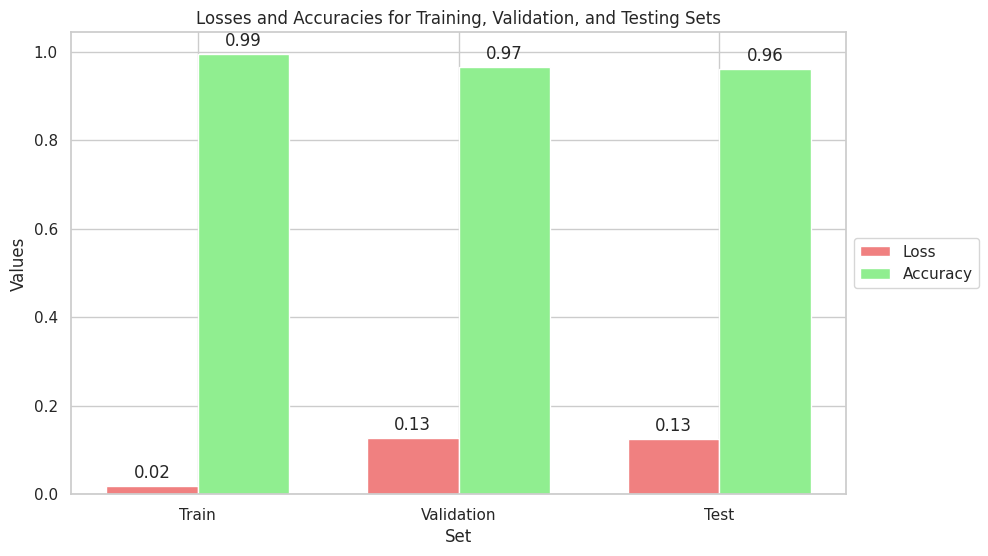

In [36]:
plot_losses_accuracies(cnn_results, 'CNN')

### [CNN] Plotting Training and Validation Metrics

The following code fragment visualizes the CNN model's training and validation loss and accuracy over epochs. This helps to assess the learning process and identify potential issues like overfitting or underfitting.

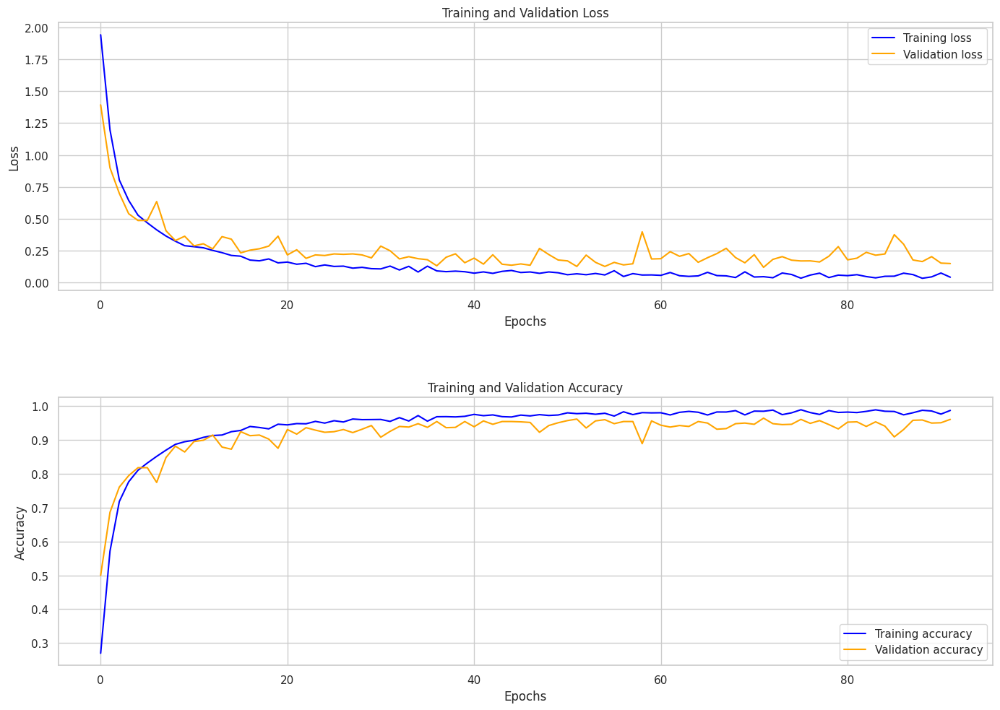

In [40]:
plot_model_history(CNN_history.history, 'CNN')

### [CNN] Model Evaluation Metrics Extraction

Evaluates the **`cnn`** model on the test dataset, providing the predicted and true classes along with class labels.

In [32]:
predictions, predicted_classes, true_classes, class_labels = evaluate_model(cnn, test_gen)

35/35 [==============================] - 1s 34ms/step


### [CNN] Generating Classification Report

The following code fragment prints a classification report that includes precision, recall, f1-score, and support for each class. This provides a detailed performance analysis of the model.

In [46]:
print(classification_report(true_classes,predicted_classes,target_names=class_labels))

                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot       0.95      0.94      0.94       110
                        Tomato___Early_blight       0.87      0.94      0.90       110
                         Tomato___Late_blight       0.96      0.92      0.94       110
                           Tomato___Leaf_Mold       0.99      0.98      0.99       110
                  Tomato___Septoria_leaf_spot       0.95      0.95      0.95       110
Tomato___Spider_mites Two-spotted_spider_mite       0.98      0.96      0.97       110
                         Tomato___Target_Spot       0.94      0.96      0.95       110
       Tomato___Tomato_Yellow_Leaf_Curl_Virus       0.99      0.95      0.97       110
                 Tomato___Tomato_mosaic_virus       0.97      1.00      0.99       110
                             Tomato___healthy       0.99      1.00      1.00       110

                                     accu

The classification report shows that the model performs well across all classes with high precision, recall, and F1-scores. The macro and weighted averages indicate that the model’s performance is consistent across classes, and the high overall accuracy **`(96%)`** suggests strong generalization to the test set.

### [CNN] Plotting Precision-Recall Curves for CNN

The following function calls plot the Precision-Recall curves for the CNN model. This visualization helps to understand how well the model distinguishes between classes, providing insight into the trade-offs between precision and recall for each class.

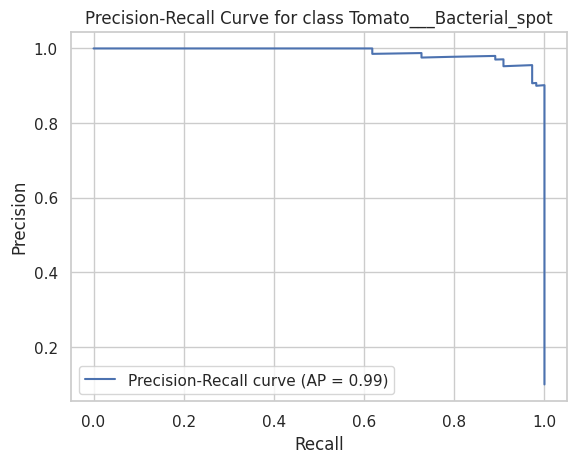

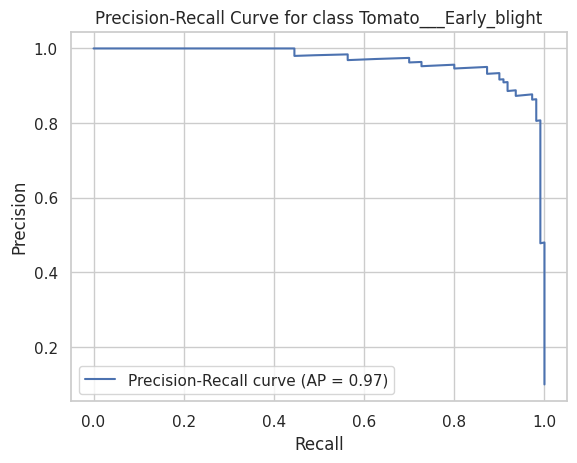

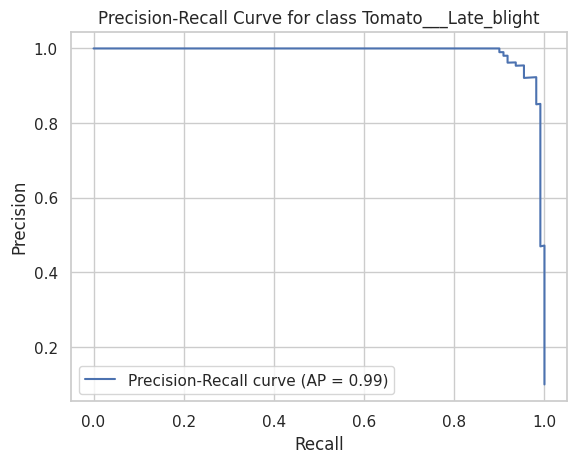

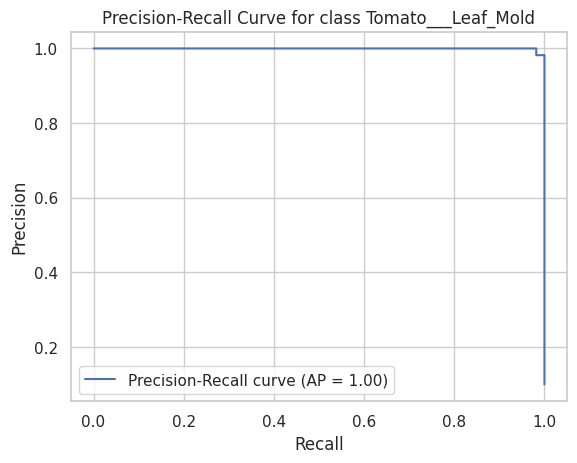

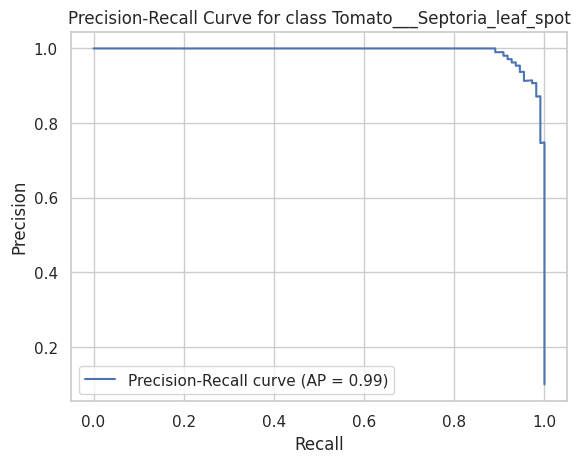

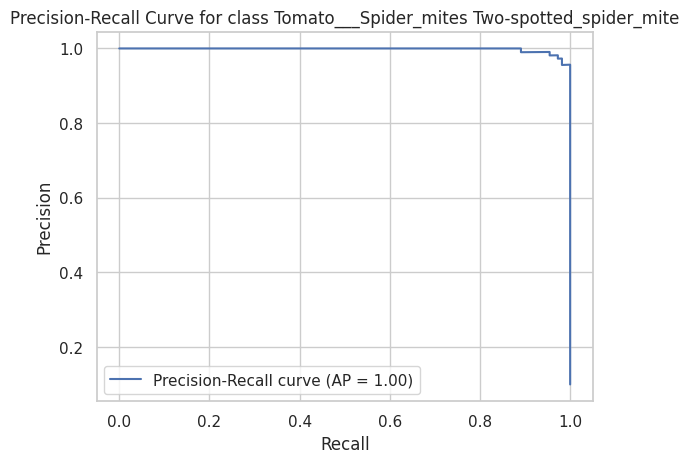

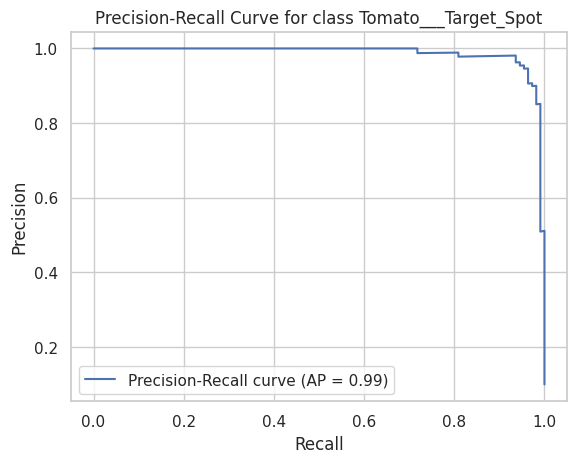

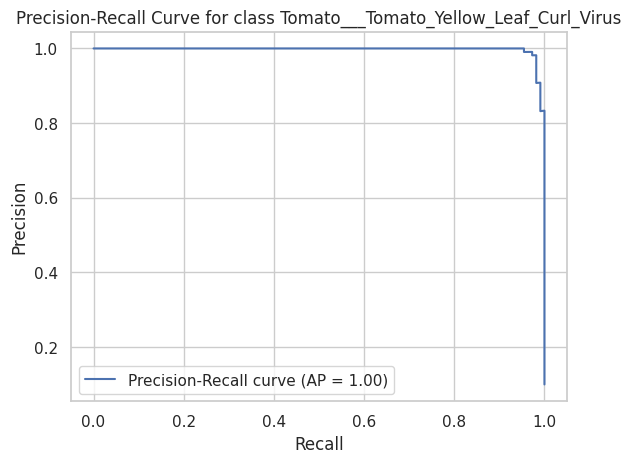

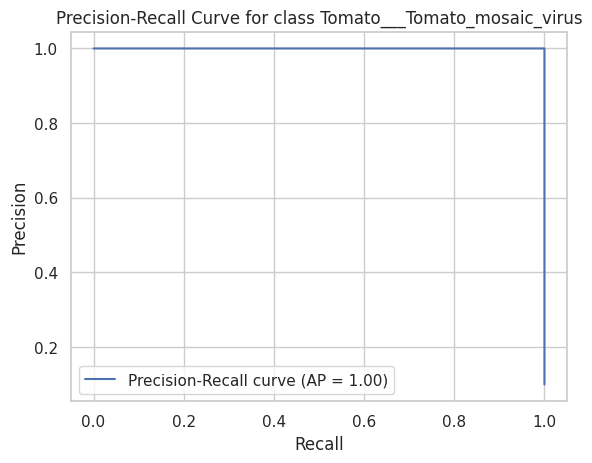

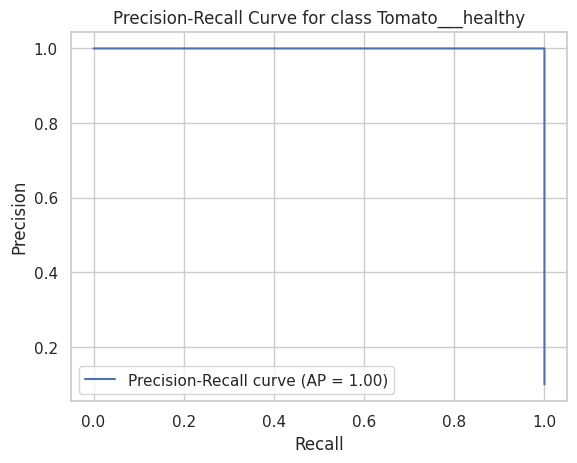

In [50]:
# Results for CNN model
plot_precision_recall_curves(true_classes, predictions, class_labels, 'CNN')

### [CNN] Plotting Confusion Matrix

The following function calls plot the confusion matrix for the CNN model. Confusion matrix provide insight into how well the model is classifying the different classes, showing the number of correct and incorrect predictions for each class.

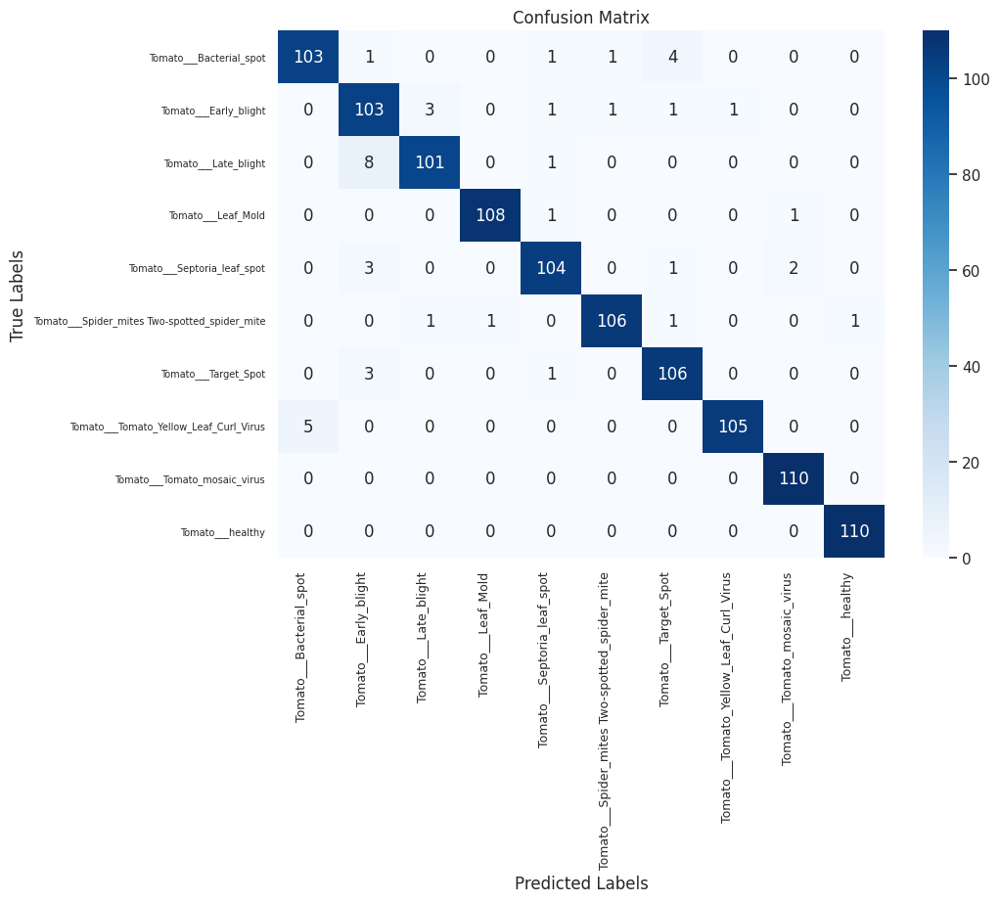

In [48]:
# Results for CNN model
plot_confusion_matrix(true_classes, predicted_classes, class_labels, 'CNN')

### [CNN] Plotting Misclassified Images for CNN Model

The following function calls plot the misclassified images for the CNN model. For each misclassified image, the true label and predicted label are displayed. This allows us to visually inspect where the model struggles and potentially identify patterns in the misclassifications.

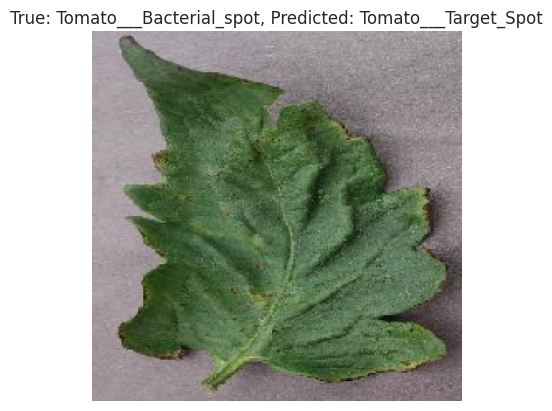

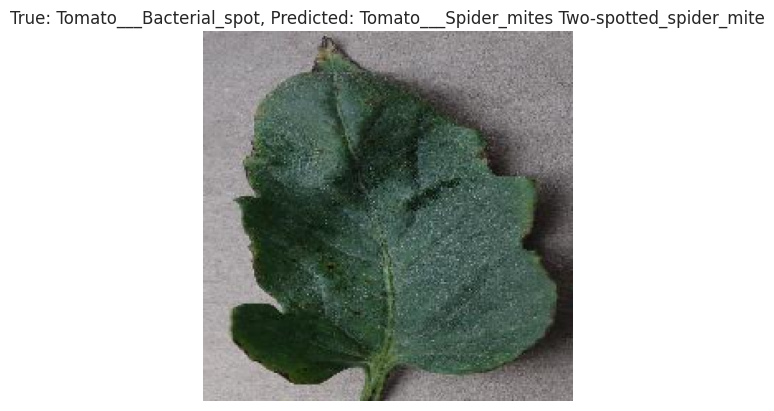

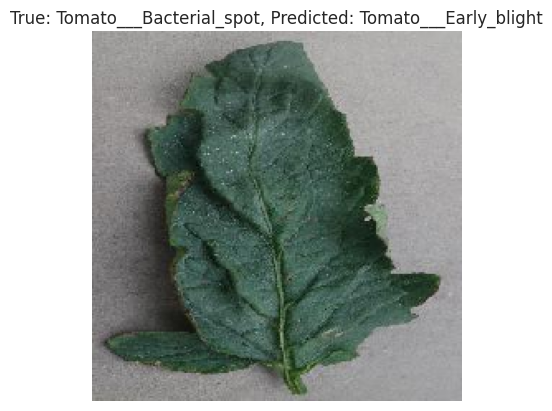

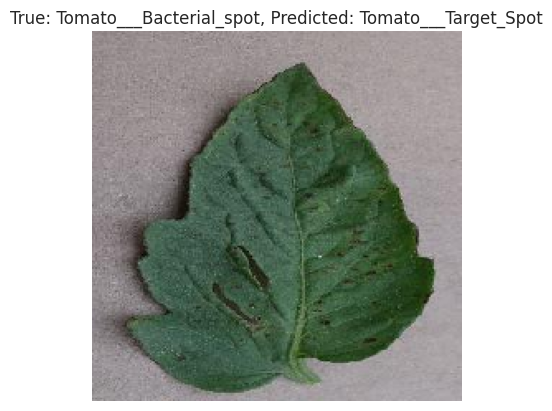

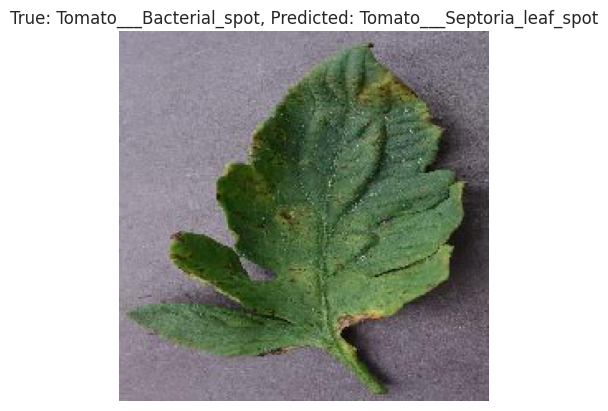

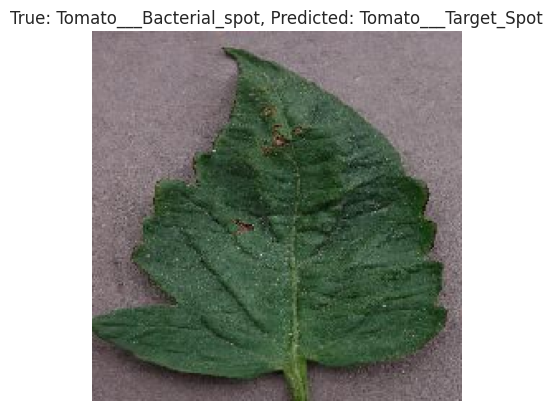

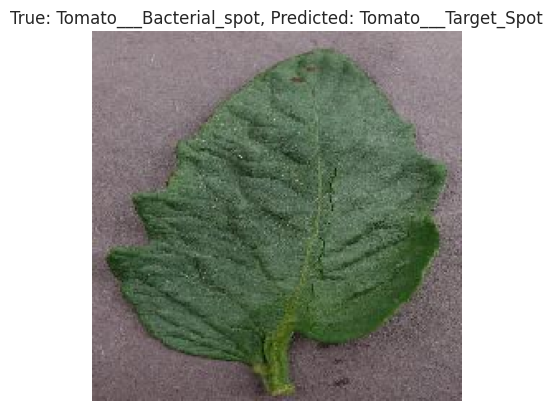

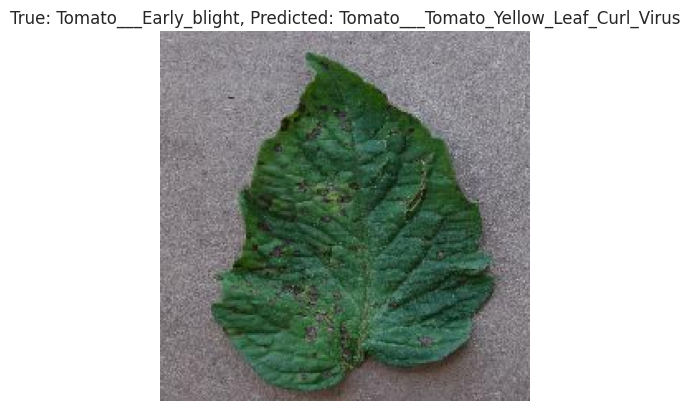

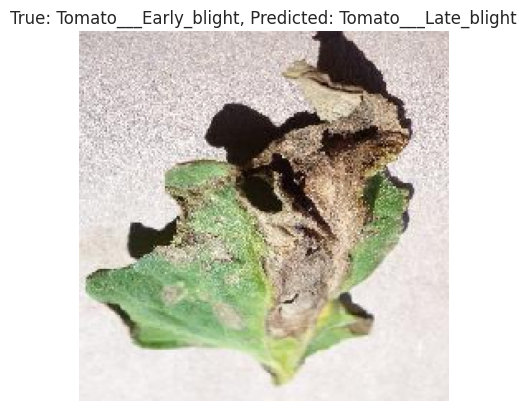

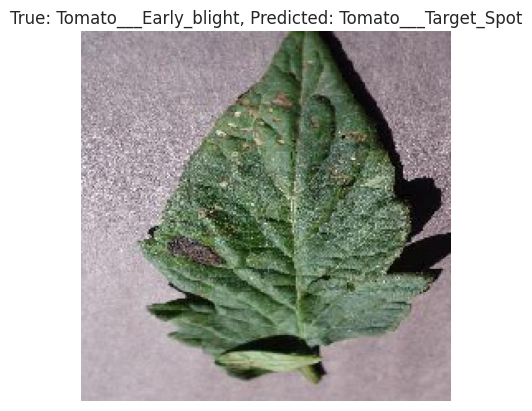

In [49]:
# Results for CNN model
plot_misclassified_images(predicted_classes, true_classes, test_gen, class_labels, 'CNN', num_images=10)

### [CNN] ROC Curve for Each Class

The following function calls plot the ROC curves for the CNN model.

 1/35 [..............................] - ETA: 5s

2024-10-02 12:26:39.834768: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - 1s 34ms/step


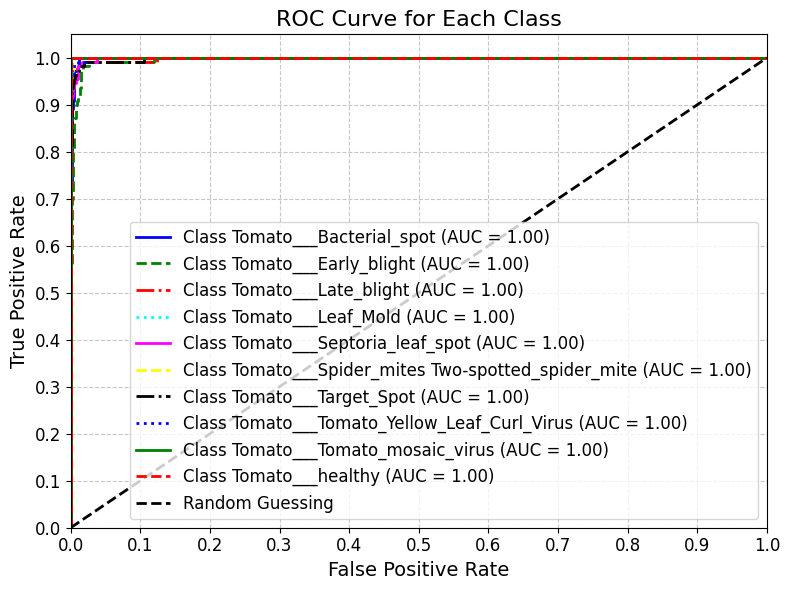

In [8]:
# Results for CNN model
plot_roc_curves(true_classes, predictions, class_labels, 'CNN')

## VGG16 (Fine-Tuned)

### [VGG16] Load Pre-trained VGG16 Base Model

In [21]:
VGG16_base_model = tf.keras.applications.vgg16.VGG16(weights='imagenet', include_top=False, input_shape = (224, 224, 3), pooling='max')

Snippet of code above initializes the **VGG16 model** pre-trained on the **ImageNet** dataset, excluding the top fully connected layers, and sets the input shape to 224x224 with 3 color channels. The pooling='max' argument adds a global max pooling layer to the model.

- **`weights='imagenet'`**: Loads the weights that the model has learned from training on the ImageNet dataset.
- **`include_top=False`**: Excludes the fully connected layers (classification head) at the top of the network. We exclude the top layers because the original VGG16 was trained to classify 1000 ImageNet classes, which is different from our 10 tomato leaf classes. This allows us to add and train new layers specific to our classification task.

### [VGG16] Freeze Layers for Fine-tuning

In [22]:
# Freeze the layers except the last 3 convolutional layers for fine-tuning
for layer in VGG16_base_model.layers[:-5]:
    layer.trainable = False

The preceding code snippet freezes all layers of the VGG16 base model except the last 4 layers. This is done to retain the learned features from the pre-trained model while allowing the last few layers to be fine-tuned on the new tomato leaf dataset.

In [23]:
for layer in VGG16_base_model.layers:
    print(layer.name, layer.trainable)

input_1 False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_pool False
block5_conv1 True
block5_conv2 True
block5_conv3 True
block5_pool True
global_max_pooling2d True


### [VGG16] Initialize and Add Base Model

In [24]:
# Initialize the Sequential model
VGG16_model = tf.keras.models.Sequential()

In [25]:
# Add the base model
VGG16_model.add(VGG16_base_model)

The above code snippets initializes a new Sequential model and adds the pre-trained VGG16 base model to it. This forms the foundation upon which additional layers will be added for the specific task of tomato leaf disease classification.

### [VGG16] Add Custom Layers

In [26]:
# Add the new layers
VGG16_model.add(tf.keras.layers.Flatten())
VGG16_model.add(tf.keras.layers.Dense(512, activation='relu'))
VGG16_model.add(tf.keras.layers.Dropout(0.2))  # Dropout layer to prevent overfitting
VGG16_model.add(tf.keras.layers.Dense(256, activation='relu'))
VGG16_model.add(tf.keras.layers.Dense(128, activation='relu'))
VGG16_model.add(tf.keras.layers.Dense(32, activation='relu'))
VGG16_model.add(tf.keras.layers.Dense(10, activation='softmax'))  # Output layer with softmax activation

The above code snippet adds new fully connected layers to the VGG16 base model. These include flattening the output, adding dense layers with ReLU activation for non-linearity, a dropout layer to prevent overfitting, and a final dense layer with softmax activation for multi-class classification of the tomato leaf diseases.

### [VGG16] Model Compilation

In [27]:
# Compile the model
VGG16_model.compile(
    optimizer=tf.keras.optimizers.Adamax(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

The above code fragment compiles the VGG16 model using the Adamax optimizer, categorical crossentropy loss function, and accuracy as the evaluation metric.

- Adam optimizer is generally preferred for most applications and is the default choice for many deep learning tasks, including training CNNs.
- Adamax optimizer is prefered due to the need for greater stability when fine-tuning these large models, especially if the pre-trained model is sensitive to gradient scaling issues or if there's a need for greater robustness against large gradient updates.

In [28]:
# Print the model summary
VGG16_model.summary()

Model: "sequential_1"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 512)               14714688  
                                                                 
 flatten_1 (Flatten)         (None, 512)               0         
                                                                 
 dense_2 (Dense)             (None, 512)               262656    
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_3 (Dense)             (None, 256)               131328    
                                                                 
 dense_4 (Dense)             (None, 128)               32896     
                                                                 
 dense_5 (Dense)             (None, 32)               

### [VGG16] Model Architecture Visualization

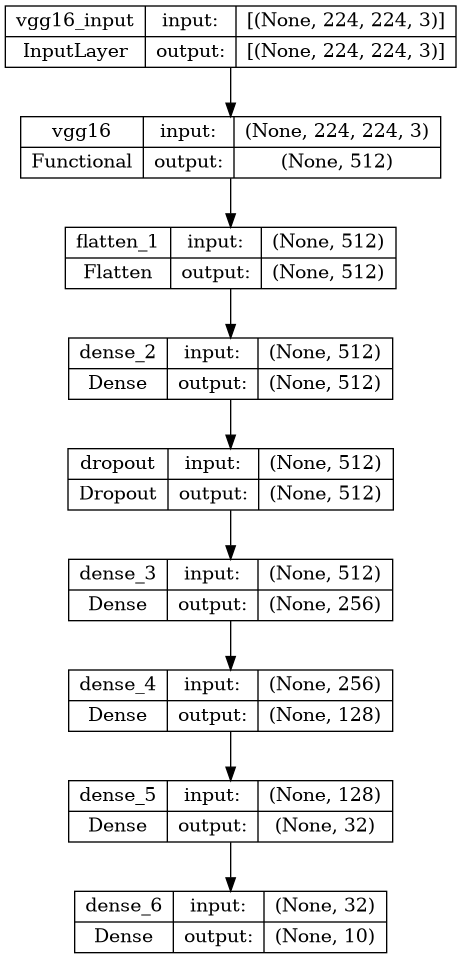

In [39]:
plot_model(VGG16_model, to_file='VGG16_model_plot.png', show_shapes=True, show_layer_names=True)

### [VGG16] Training VGG16 Model and Measuring Training Time

The following code snippet trains the VGG16 model using the training data generator (**`train_gen`**) and validates it using the validation data generator (**`val_gen`**).

In [59]:
start = time.time()

VGG16_history = VGG16_model.fit(train_gen, epochs= 50, verbose= 1, validation_data= val_gen, shuffle= False)

VGG16_total_training_time = time.time() - start

Epoch 1/50


2024-08-11 05:06:43.748899: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2024-08-11 05:06:45.029259: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 1.74GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-08-11 05:06:45.995763: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 3.46GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.
2024-08-11 05:06:45.995806: W tensorflow/tsl/framework/bfc_allocator

275/275 [==============================] - ETA: 0s - loss: 1.4944 - accuracy: 0.4917

2024-08-11 05:08:03.798531: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]
2024-08-11 05:08:12.259467: W tensorflow/tsl/framework/bfc_allocator.cc:296] Allocator (GPU_0_bfc) ran out of memory trying to allocate 2.41GiB with freed_by_count=0. The caller indicates that this is not a failure, but this may mean that there could be performance gains if more memory were available.


275/275 [==============================] - 91s 299ms/step - loss: 1.4944 - accuracy: 0.4917 - val_loss: 0.7318 - val_accuracy: 0.7709
Epoch 2/50
275/275 [==============================] - 79s 288ms/step - loss: 0.6998 - accuracy: 0.7765 - val_loss: 0.5115 - val_accuracy: 0.8345
Epoch 3/50
275/275 [==============================] - 79s 288ms/step - loss: 0.4626 - accuracy: 0.8495 - val_loss: 0.3120 - val_accuracy: 0.9055
Epoch 4/50
275/275 [==============================] - 80s 289ms/step - loss: 0.3641 - accuracy: 0.8813 - val_loss: 0.2391 - val_accuracy: 0.9282
Epoch 5/50
275/275 [==============================] - 79s 288ms/step - loss: 0.2834 - accuracy: 0.9062 - val_loss: 0.2198 - val_accuracy: 0.9373
Epoch 6/50
275/275 [==============================] - 80s 289ms/step - loss: 0.2371 - accuracy: 0.9234 - val_loss: 0.2322 - val_accuracy: 0.9282
Epoch 7/50
275/275 [==============================] - 80s 289ms/step - loss: 0.2052 - accuracy: 0.9336 - val_loss: 0.1694 - val_accuracy: 0.9

### [VGG16] Training Time Estimation

In [60]:
h, m, s = map(lambda x: int(x), [VGG16_total_training_time/3600, VGG16_total_training_time%3600/60, VGG16_total_training_time%60])
print(f"Total Training Time: {h:02d}:{m:02d}:{s:02d}")

Total Training Time: 01:06:40


### [VGG16] Model Evaluation

Evaluates the VGG16 model on the training, validation, and test datasets, storing the performance metrics in a structured format.

In [30]:
# Evaluate VGG16 model
vgg16_results = evaluate_and_store_results(VGG16_model, train_gen, val_gen, test_gen, "vgg16")

275/275 [==============================] - 61s 222ms/step - loss: 0.0025 - accuracy: 0.9992
[VGG16] Training loss: 0.002512195147573948
[VGG16] Training accuracy: 0.9992045164108276

35/35 [==============================] - 8s 218ms/step - loss: 0.1195 - accuracy: 0.9727
[VGG16] Validation loss: 0.11952737718820572
[VGG16] Validation accuracy: 0.9727272987365723

35/35 [==============================] - 8s 214ms/step - loss: 0.1355 - accuracy: 0.9645
[VGG16] Testing loss: 0.13554556667804718
[VGG16] Testing accuracy: 0.9645454287528992


### [VGG16] Saving VGG16 Model and Training History

In [ ]:
VGG16_model.save(f'Models/{split_ratio}/VGG16_trained_tomato_leaf_disease_model.keras')

In [ ]:
# Recording History in json
with open(f'Models_Training_History/{split_ratio}/training_hist_VGG16.json','w') as f:
  json.dump(VGG16_history.history,f,indent=4)

### [VGG16] Overall Loss-Accurary Results for VGG16 Model

The following function calls plot the losses and accuracies for the VGG16 model. The plots compare the training, validation, and test performance for the model, helping to visualize the models' generalization ability and the potential for overfitting or underfitting.

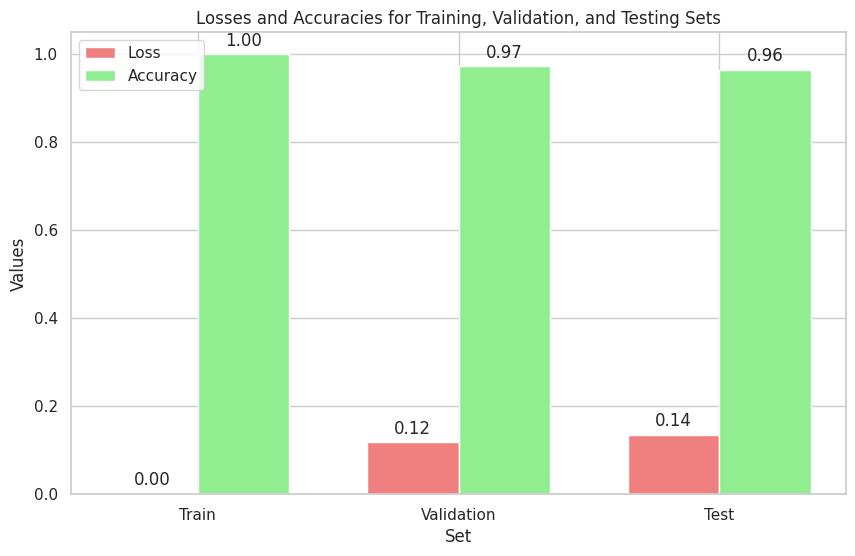

In [66]:
plot_losses_accuracies(vgg16_results, 'VGG16')

### [VGG16] Plotting Training and Validation Metrics

This plot visualizes the training and validation loss and accuracy over epochs for the VGG16 model. Use this to evaluate the model's performance and tuning needs.

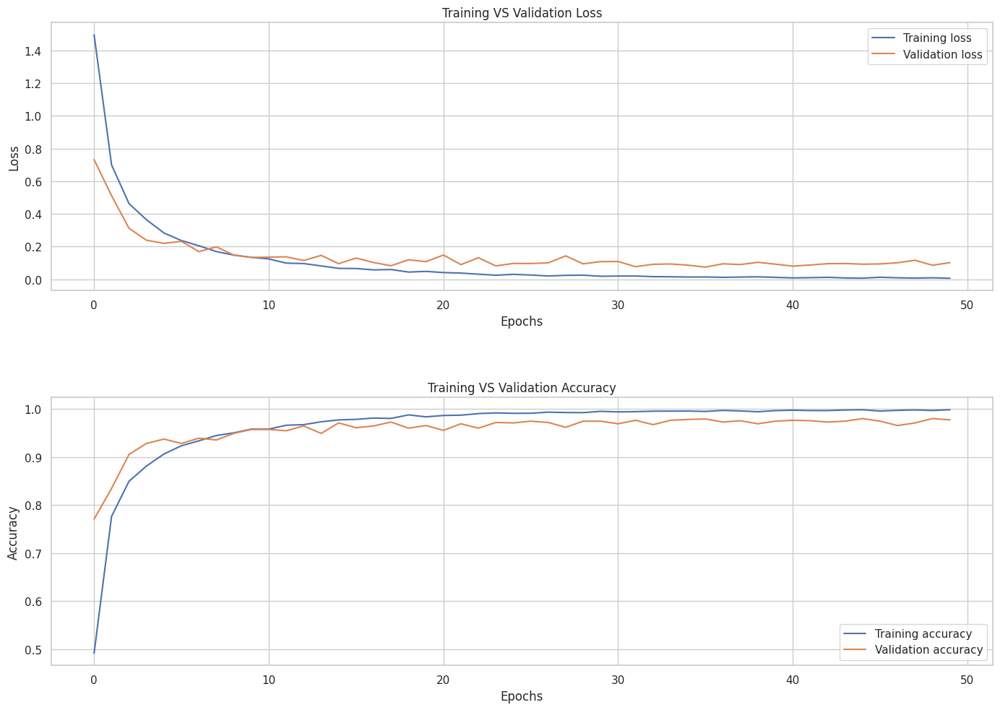

In [67]:
plot_model_history(VGG16_history.history, 'VGG16')

### [VGG16] Model Evaluation Metrics Extraction

Evaluates the **`VGG16_model`** on the test dataset to return predictions, ground-truth classes, and class labels.

In [33]:
predictions, predicted_classes, true_classes, class_labels = evaluate_model(VGG16_model, test_gen)

35/35 [==============================] - 8s 217ms/step


### [VGG16] Generating Classification Report

The following code snippet prints a classification report that includes precision, recall, f1-score, and support for each class. This provides a detailed performance analysis of the model.

In [71]:
print(classification_report(true_classes,predicted_classes,target_names=class_labels))

                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot       0.99      1.00      1.00       110
                        Tomato___Early_blight       0.97      0.89      0.93       110
                         Tomato___Late_blight       0.98      0.99      0.99       110
                           Tomato___Leaf_Mold       0.99      0.97      0.98       110
                  Tomato___Septoria_leaf_spot       0.95      0.97      0.96       110
Tomato___Spider_mites Two-spotted_spider_mite       0.86      1.00      0.92       110
                         Tomato___Target_Spot       0.95      0.83      0.88       110
       Tomato___Tomato_Yellow_Leaf_Curl_Virus       0.99      0.99      0.99       110
                 Tomato___Tomato_mosaic_virus       1.00      1.00      1.00       110
                             Tomato___healthy       0.98      1.00      0.99       110

                                     accu

### [VGG16] Plotting Precision-Recall Curves for VGG16

The following function calls plot the Precision-Recall curves for the VGG16 model. This visualization helps to understand how well the model distinguishes between classes, providing insight into the trade-offs between precision and recall for each class.

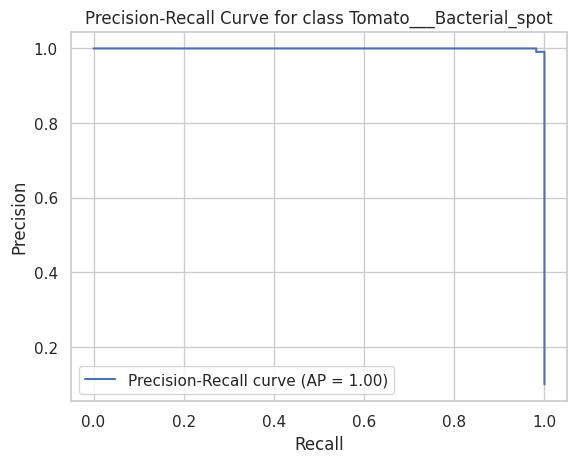

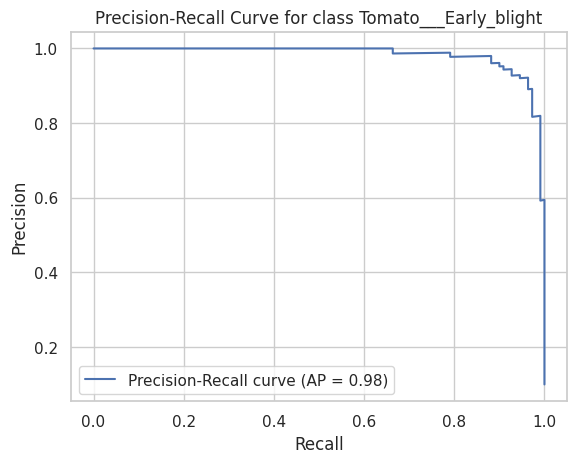

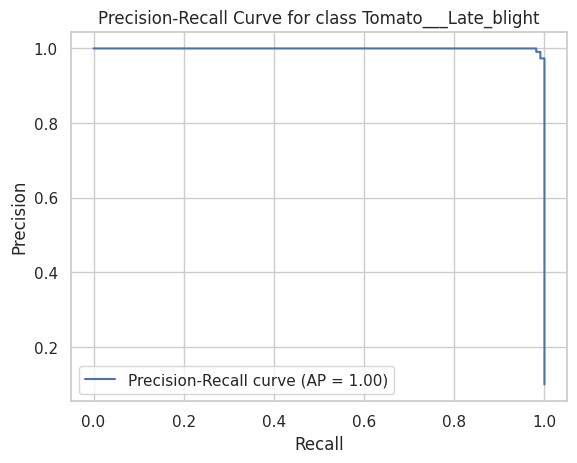

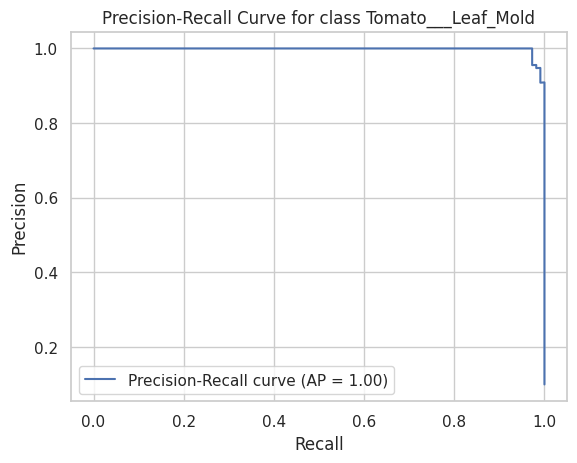

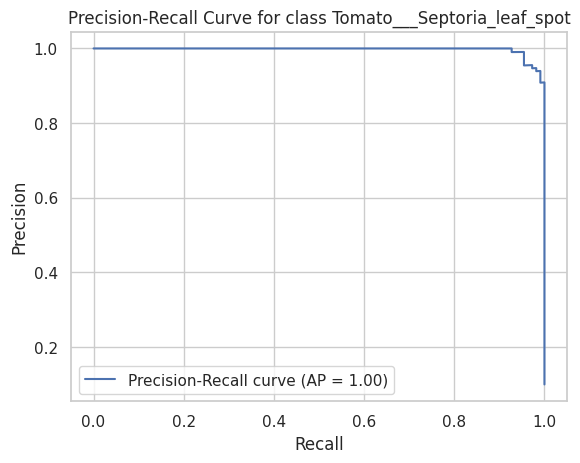

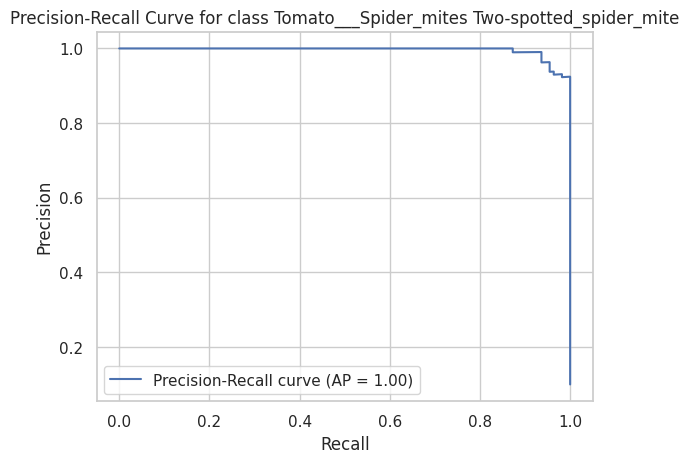

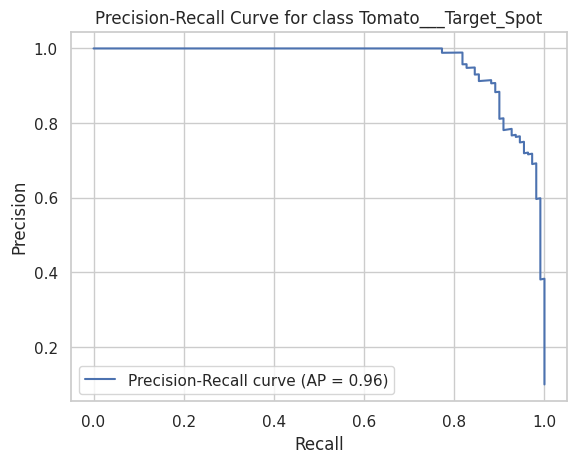

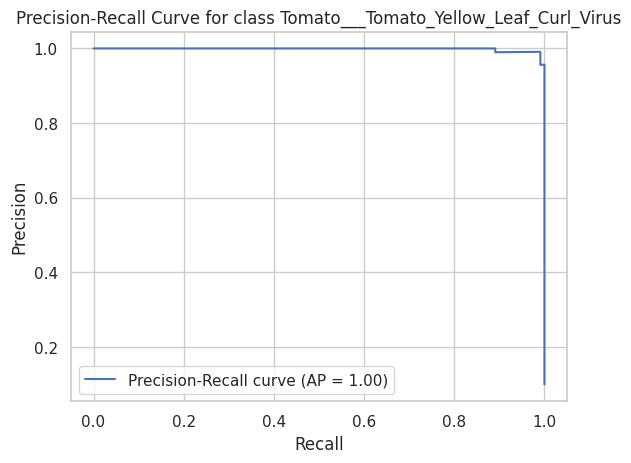

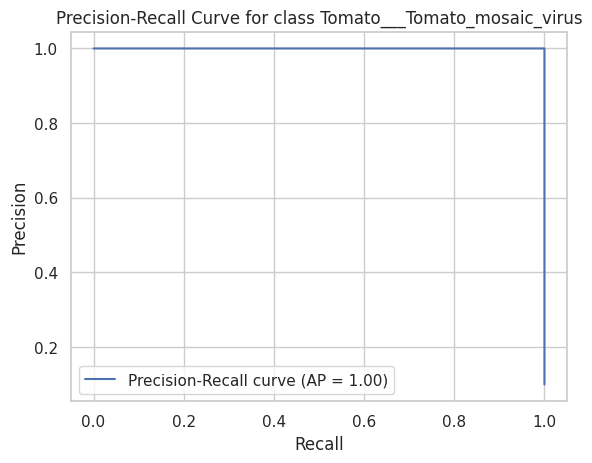

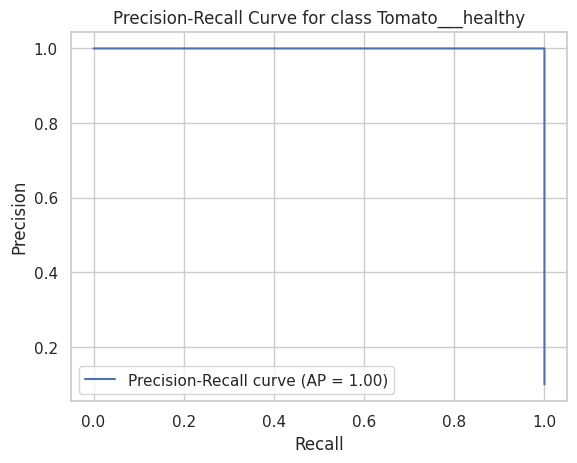

In [77]:
# Results for VGG16 model
plot_precision_recall_curves(true_classes, predictions, class_labels, 'VGG16')

### [VGG16] Plotting Confusion Matrix

The following function calls plot the confusion matrix for the VGG16 model. Confusion matrix provide insight into how well the model is classifying the different classes, showing the number of correct and incorrect predictions for each class.

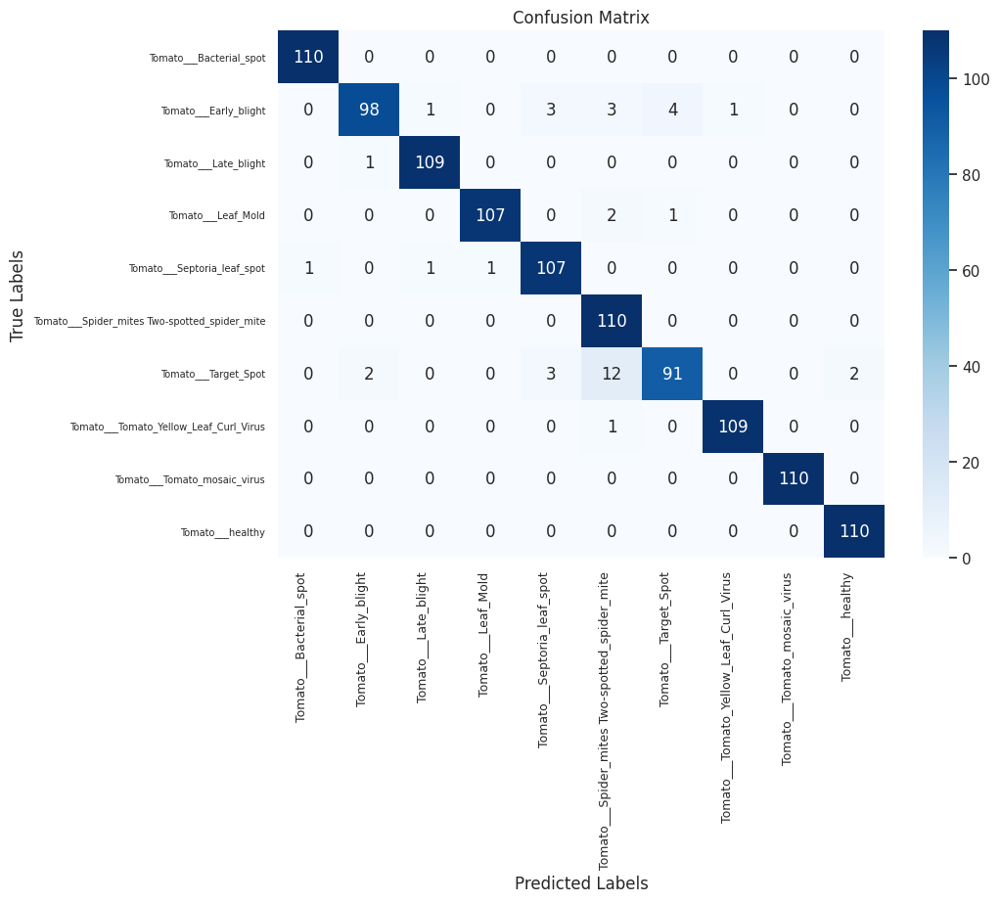

In [73]:
# Results for VGG16 model
plot_confusion_matrix(true_classes, predicted_classes, class_labels, 'VGG16')


### [VGG16] Plotting Misclassified Images for VGG16 Model

The following function calls plot the misclassified images for the VGG16 model. For each misclassified image, the true label and predicted label are displayed. This allows us to visually inspect where the model struggles and potentially identify patterns in the misclassifications.

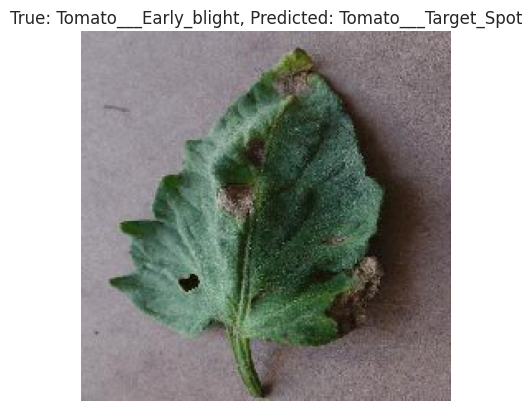

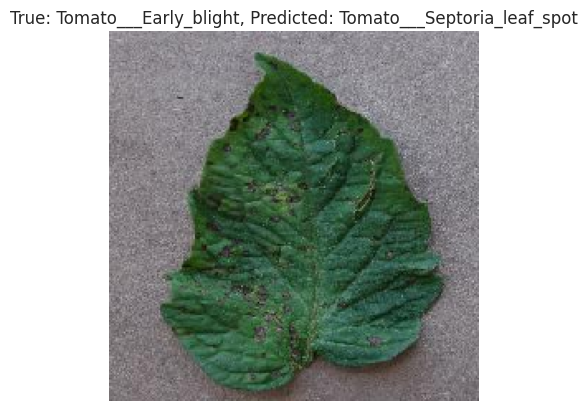

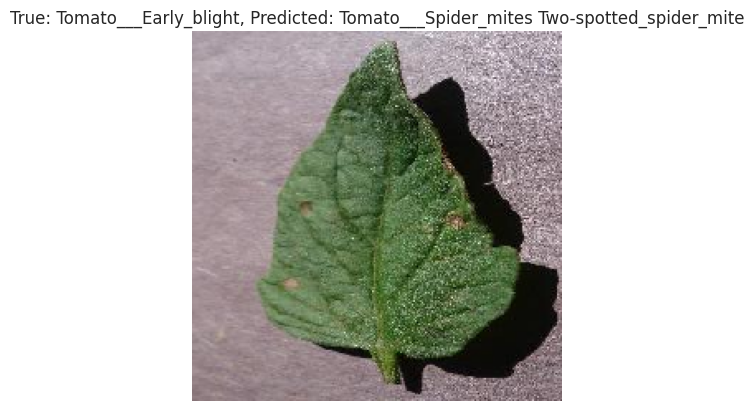

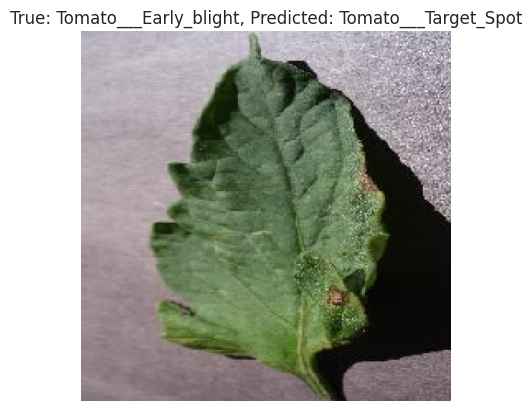

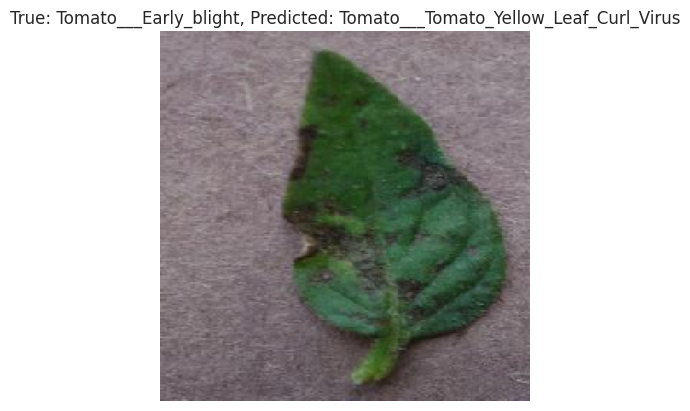

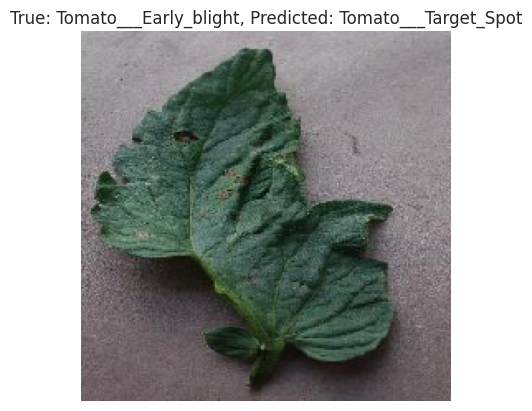

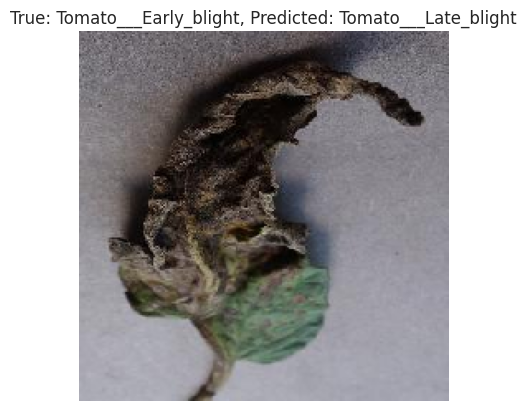

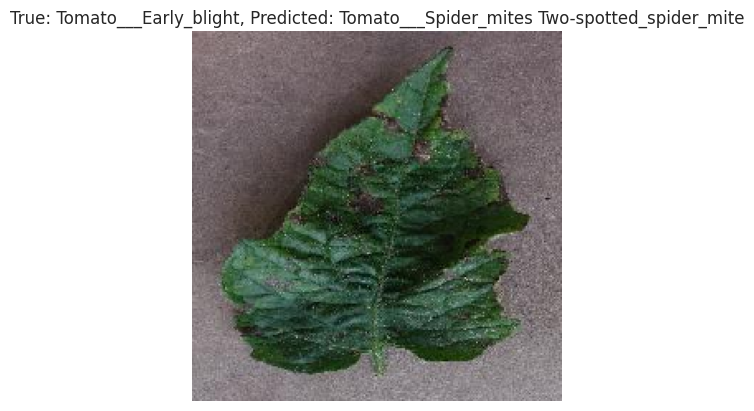

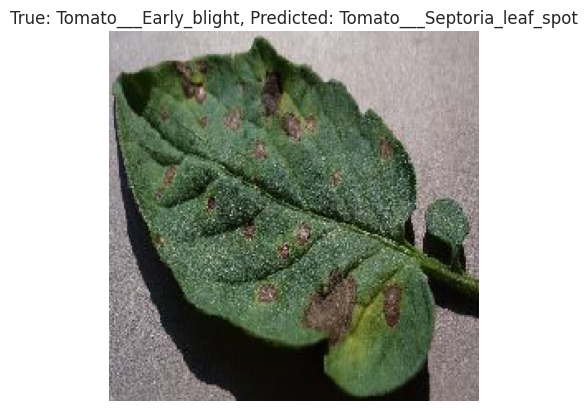

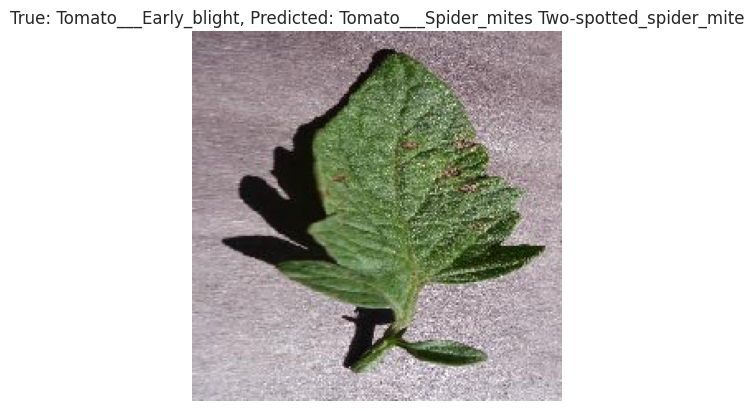

In [76]:
# Results for VGG16 model
plot_misclassified_images(predicted_classes, true_classes, test_gen, class_labels, 'VGG16', num_images=10)

### [VGG16] ROC Curve for Each Class

2024-10-02 15:19:34.074730: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - 8s 218ms/step


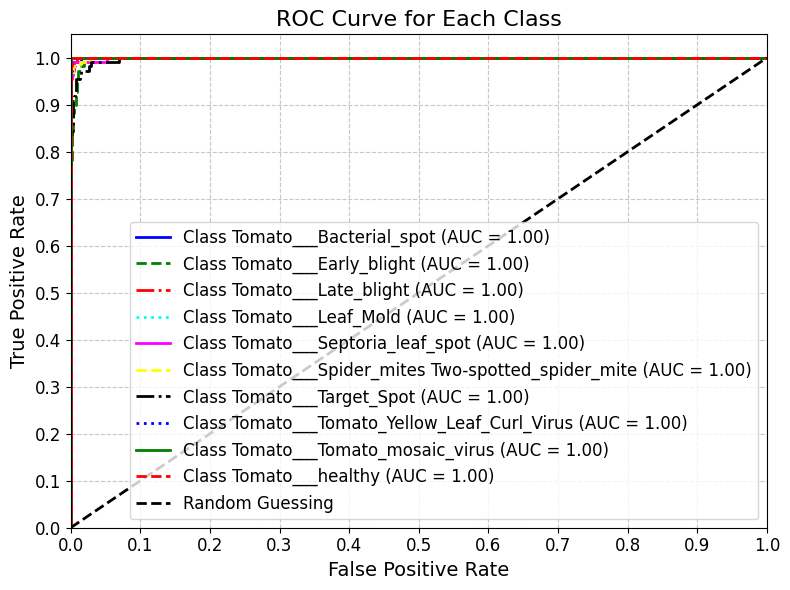

In [8]:
# Results for VGG16 model
plot_roc_curves(true_classes, predictions, class_labels, 'VGG16')

## VGG19 (Fine-Tuned)

### [VGG19] Load Pre-trained VGG19 Base Model

In [30]:
VGG19_base_model = tf.keras.applications.vgg19.VGG19(weights='imagenet', include_top=False, input_shape = (224, 224, 3), pooling= 'max')

This code snippet above initializes the VGG19 model pre-trained on the ImageNet dataset, excluding the top fully connected layers, and sets the input shape to 224x224 with 3 color channels. The pooling='max' argument adds a global max pooling layer to the model.

### [VGG19] Freeze Layers for Fine-tuning

In [31]:
for layer in VGG19_base_model.layers[:-5]:
    layer.trainable = False

The previous code snippet freezes all layers of the VGG19 base model except the last 4 layers. This is done to retain the learned features from the pre-trained model while allowing the last few layers to be fine-tuned on the new tomato leaf dataset.

In [32]:
for layer in VGG19_base_model.layers:
    print(layer.name, layer.trainable)

input_2 False
block1_conv1 False
block1_conv2 False
block1_pool False
block2_conv1 False
block2_conv2 False
block2_pool False
block3_conv1 False
block3_conv2 False
block3_conv3 False
block3_conv4 False
block3_pool False
block4_conv1 False
block4_conv2 False
block4_conv3 False
block4_conv4 False
block4_pool False
block5_conv1 False
block5_conv2 True
block5_conv3 True
block5_conv4 True
block5_pool True
global_max_pooling2d_1 True


### [VGG19] Initialize and Add Base Model

In [33]:
# Initialize the Sequential model
VGG19_model = tf.keras.models.Sequential()

In [34]:
# Add the base model
VGG19_model.add(VGG19_base_model)

The above code snippets initializes a new Sequential model and adds the pre-trained VGG19 base model to it. This forms the foundation upon which additional layers will be added for the specific task of tomato leaf disease classification.

### [VGG19] Add Custom Layers

In [35]:
# Add the new layers
VGG19_model.add(tf.keras.layers.Flatten())
VGG19_model.add(tf.keras.layers.Dense(512, activation='relu'))
VGG19_model.add(tf.keras.layers.Dropout(0.2))  # Dropout layer to prevent overfitting
VGG19_model.add(tf.keras.layers.Dense(256, activation='relu'))
VGG19_model.add(tf.keras.layers.Dense(128, activation='relu'))
VGG19_model.add(tf.keras.layers.Dense(32, activation='relu'))
VGG19_model.add(tf.keras.layers.Dense(10, activation='softmax'))  # Output layer with softmax activation

The previous code segment adds new fully connected layers to the VGG19 base model. These include flattening the output, adding dense layers with ReLU activation for non-linearity, a dropout layer to prevent overfitting, and a final dense layer with softmax activation for multi-class classification of the tomato leaf diseases.

### [VGG19] Model Compilation

In [36]:
# Compile the model
VGG19_model.compile(
    optimizer=tf.keras.optimizers.Adamax(learning_rate=0.0001),
    loss='categorical_crossentropy',
    metrics=['accuracy']
)

The code snippet above compiles the VGG19 model using the Adamax optimizer, categorical crossentropy loss function, and accuracy as the evaluation metric.

In [37]:
# Print the model summary
VGG19_model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg19 (Functional)          (None, 512)               20024384  
                                                                 
 flatten_2 (Flatten)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 512)               262656    
                                                                 
 dropout_1 (Dropout)         (None, 512)               0         
                                                                 
 dense_8 (Dense)             (None, 256)               131328    
                                                                 
 dense_9 (Dense)             (None, 128)               32896     
                                                                 
 dense_10 (Dense)            (None, 32)               

### [VGG19] Model Architecture Visualization

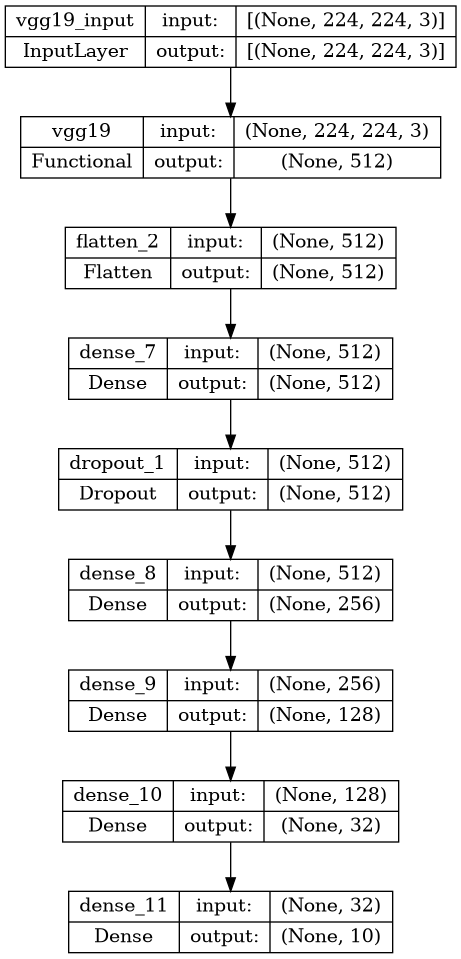

In [38]:
plot_model(VGG19_model, to_file='VGG19_model_plot.png', show_shapes=True, show_layer_names=True)

### [VGG19] Training VGG19 Model and Measuring Training Time

The following code snippet trains the VGG19 model using the training data generator (**`train_gen`**) and validates it using the validation data generator (**`val_gen`**).

In [86]:
start = time.time()

VGG19_history = VGG19_model.fit(train_gen, epochs= 50, verbose= 1, validation_data= val_gen, shuffle= False)

VGG19_total_training_time = time.time() - start # Calculate training time

Epoch 1/50


2024-08-11 09:51:47.612374: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


275/275 [==============================] - ETA: 0s - loss: 1.4394 - accuracy: 0.5070

2024-08-11 09:53:14.327537: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


275/275 [==============================] - 96s 343ms/step - loss: 1.4394 - accuracy: 0.5070 - val_loss: 0.7672 - val_accuracy: 0.7209
Epoch 2/50
275/275 [==============================] - 95s 344ms/step - loss: 0.7420 - accuracy: 0.7568 - val_loss: 0.5444 - val_accuracy: 0.8245
Epoch 3/50
275/275 [==============================] - 95s 343ms/step - loss: 0.5466 - accuracy: 0.8140 - val_loss: 0.4257 - val_accuracy: 0.8591
Epoch 4/50
275/275 [==============================] - 95s 344ms/step - loss: 0.4262 - accuracy: 0.8523 - val_loss: 0.3534 - val_accuracy: 0.8782
Epoch 5/50
275/275 [==============================] - 95s 344ms/step - loss: 0.3617 - accuracy: 0.8744 - val_loss: 0.3606 - val_accuracy: 0.8727
Epoch 6/50
275/275 [==============================] - 95s 344ms/step - loss: 0.3097 - accuracy: 0.8963 - val_loss: 0.2853 - val_accuracy: 0.9109
Epoch 7/50
275/275 [==============================] - 95s 344ms/step - loss: 0.2636 - accuracy: 0.9101 - val_loss: 0.2677 - val_accuracy: 0.9

### [VGG19] Training Time Estimation

In [88]:
h, m, s = map(lambda x: int(x), [VGG19_total_training_time/3600, VGG19_total_training_time%3600/60, VGG19_total_training_time%60])
print(f"Total Training Time: {h:02d}:{m:02d}:{s:02d}")

Total Training Time: 01:19:07


### [VGG19] Model Evaluation

Evaluates the VGG19 model on the training, validation, and test datasets, saving the results in a dictionary for easy access.

In [31]:
# Evaluate VGG19 model
vgg19_results = evaluate_and_store_results(VGG19_model, train_gen, val_gen, test_gen, "vgg19")

275/275 [==============================] - 74s 269ms/step - loss: 0.0072 - accuracy: 0.9985
[VGG16] Training loss: 0.007238935679197311
[VGG16] Training accuracy: 0.9985226988792419

35/35 [==============================] - 10s 266ms/step - loss: 0.1531 - accuracy: 0.9536
[VGG16] Validation loss: 0.15313629806041718
[VGG16] Validation accuracy: 0.9536363482475281

35/35 [==============================] - 9s 260ms/step - loss: 0.2059 - accuracy: 0.9400
[VGG16] Testing loss: 0.20594877004623413
[VGG16] Testing accuracy: 0.9399999976158142


### [VGG19] Saving VGG19 Model and Training History

In [ ]:
VGG19_model.save(f'Models/{split_ratio}/VGG19_trained_tomato_leaf_disease_model.keras')

In [ ]:
# Recording History in json
with open(f'Models_Training_History/{split_ratio}/training_hist_VGG19.json','w') as f:
  json.dump(VGG19_history.history,f,indent=4)

### [VGG19] Overall Loss-Accurary Results for VGG19 Model

The following function calls plot the losses and accuracies for the VGG19 model. The plots compare the training, validation, and test performance for the model, helping to visualize the models' generalization ability and the potential for overfitting or underfitting.

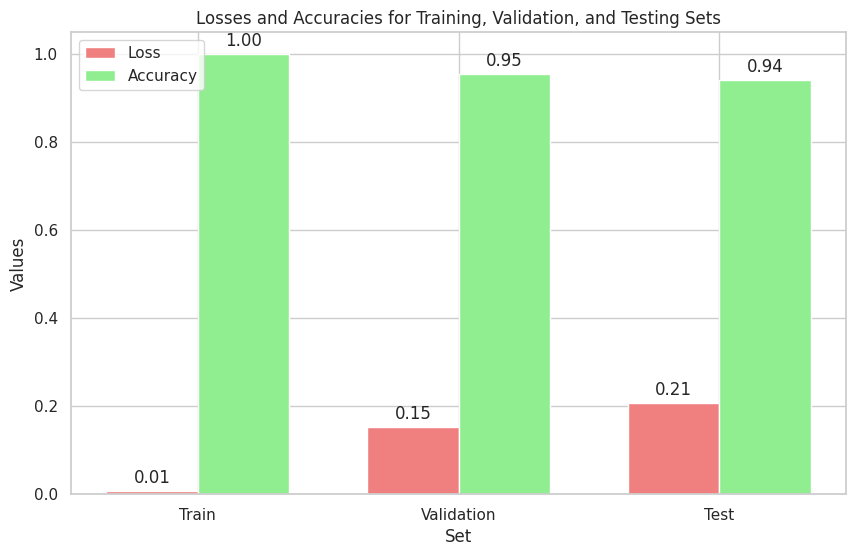

In [94]:
plot_losses_accuracies(vgg19_results, 'VGG19')

### [VGG19] Plotting Training and Validation Metrics

Similar to the other models, this plot shows the VGG19 model's learning progress by plotting training and validation loss and accuracy across epochs.

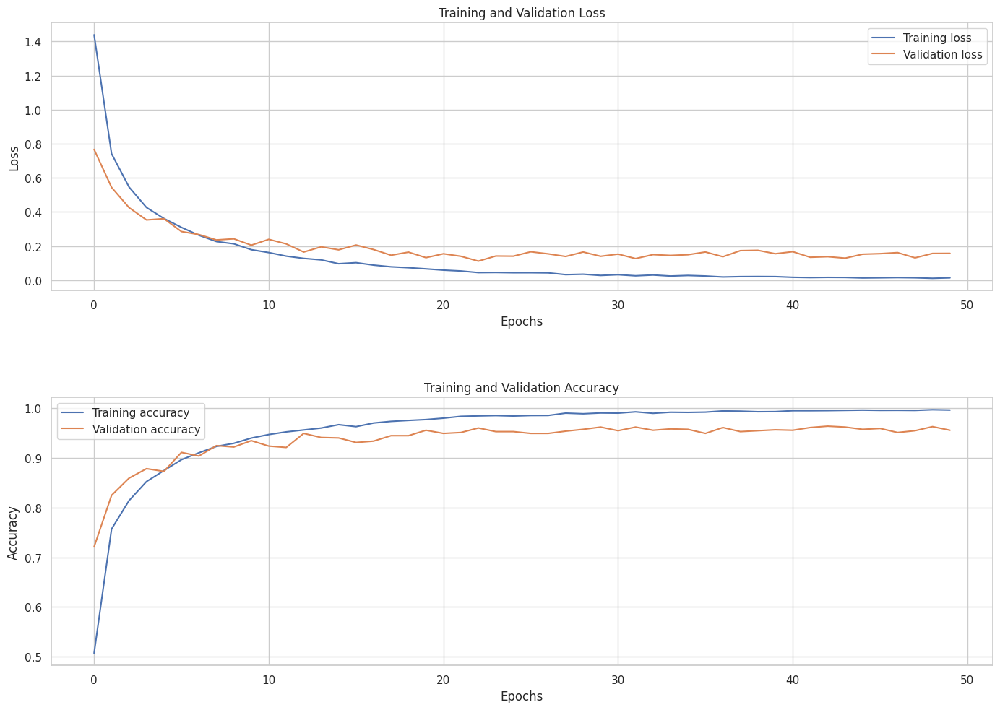

In [95]:
plot_model_history(VGG19_history.history, 'VGG19')

### [VGG19] Model Evaluation Metrics Extraction

Evaluates the **`VGG19_model`** on the test dataset to return predictions, ground-truth classes, and class labels.

In [34]:
predictions, predicted_classes, true_classes, class_labels = evaluate_model(VGG19_model, test_gen)

35/35 [==============================] - 9s 266ms/step


### [VGG19] Generating Classification Report

The following code snippet prints a classification report that includes precision, recall, f1-score, and support for each class. This provides a detailed performance analysis of the model.

In [99]:
print(classification_report(true_classes,predicted_classes,target_names=class_labels))

                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot       1.00      0.92      0.96       110
                        Tomato___Early_blight       0.96      0.81      0.88       110
                         Tomato___Late_blight       0.88      0.99      0.93       110
                           Tomato___Leaf_Mold       0.99      0.90      0.94       110
                  Tomato___Septoria_leaf_spot       0.90      0.96      0.93       110
Tomato___Spider_mites Two-spotted_spider_mite       0.96      0.90      0.93       110
                         Tomato___Target_Spot       0.83      0.93      0.88       110
       Tomato___Tomato_Yellow_Leaf_Curl_Virus       0.99      0.99      0.99       110
                 Tomato___Tomato_mosaic_virus       0.98      1.00      0.99       110
                             Tomato___healthy       0.95      1.00      0.97       110

                                     accu

### [VGG19] Plotting Precision-Recall Curves for VGG19

The following function calls plot the Precision-Recall curves for the VGG19 model. This visualization helps to understand how well the model distinguishes between classes, providing insight into the trade-offs between precision and recall for each class.

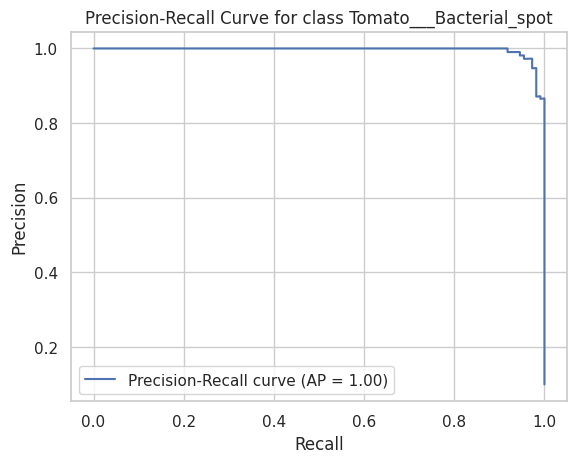

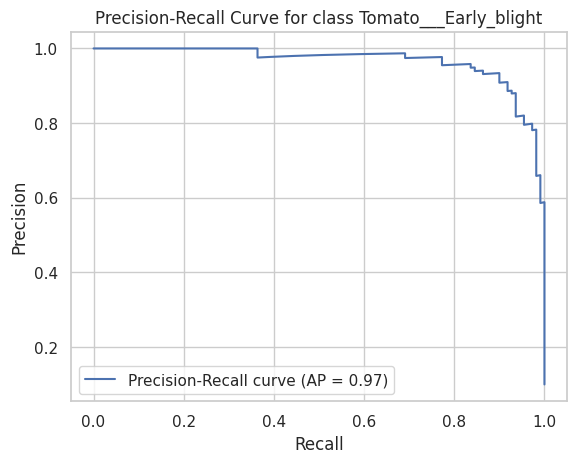

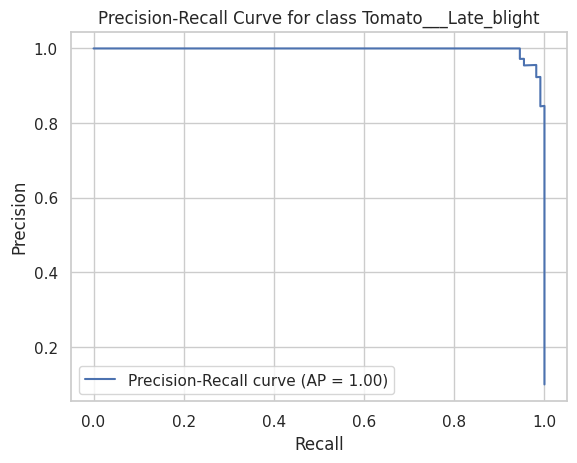

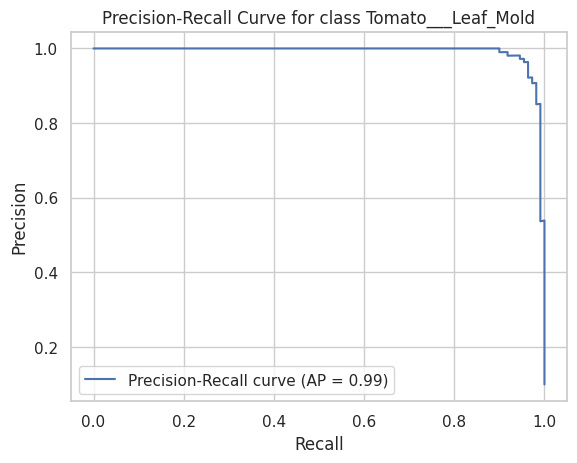

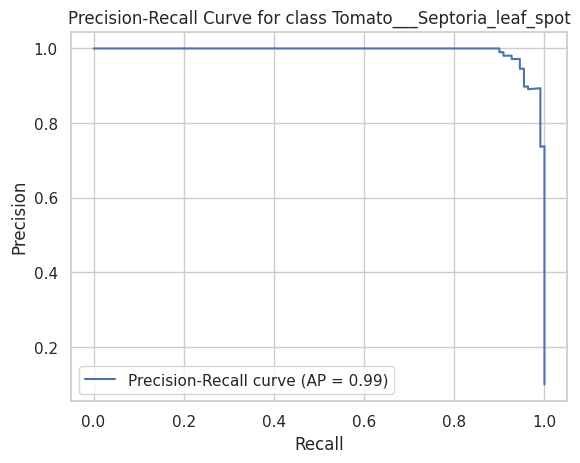

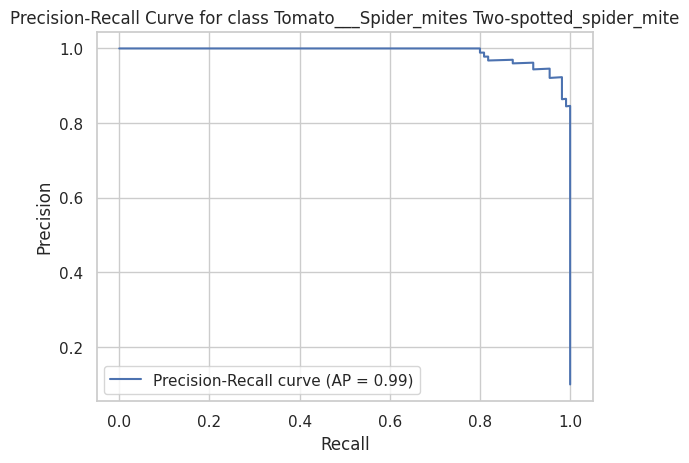

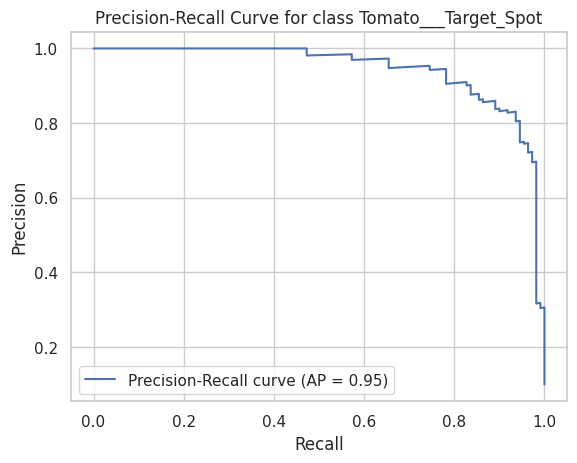

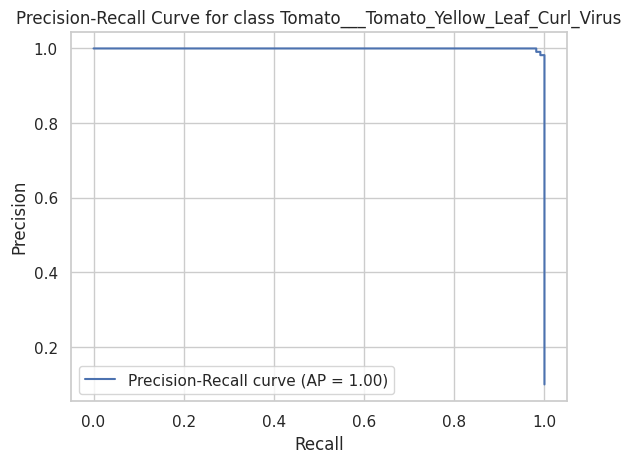

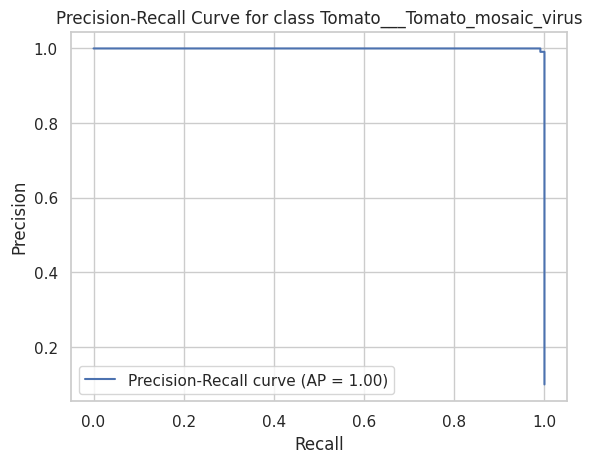

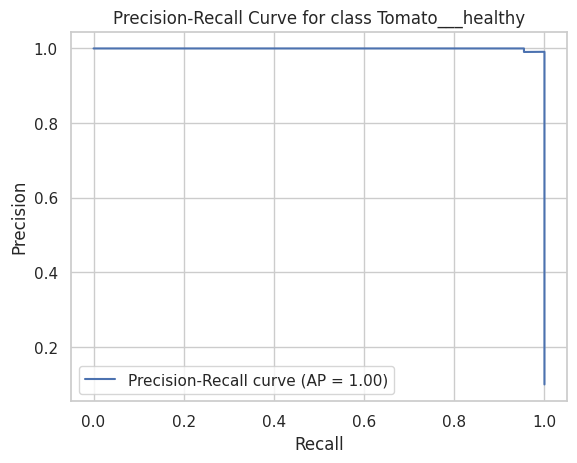

In [103]:
# Results for VGG19 model
plot_precision_recall_curves(true_classes, predictions, class_labels, 'VGG19')

### [VGG19] Plotting Confusion Matrix

The following function calls plot the confusion matrix for the VGG19 model. Confusion matrix provide insight into how well the model is classifying the different classes, showing the number of correct and incorrect predictions for each class.

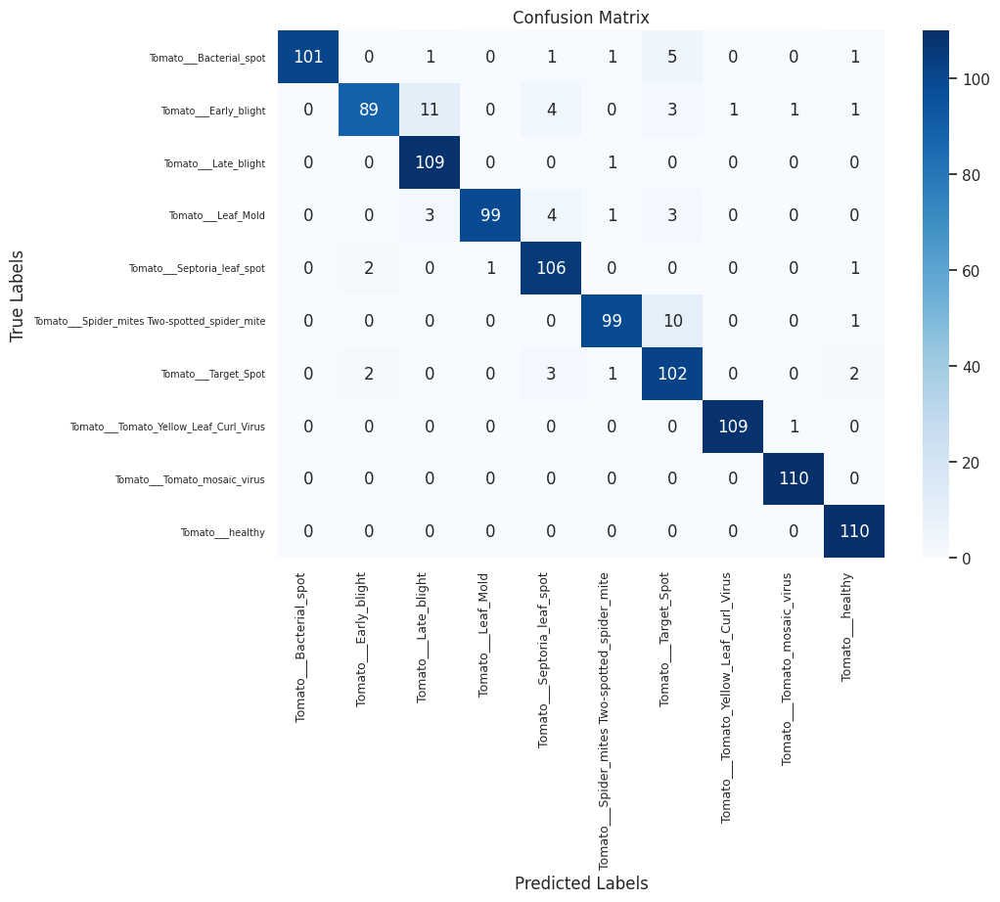

In [101]:
# Results for VGG19 model
plot_confusion_matrix(true_classes, predicted_classes, class_labels, 'VGG19')

### [VGG19] Plotting Misclassified Images for VGG19 Model

The following function calls plot the misclassified images for the VGG19 model. For each misclassified image, the true label and predicted label are displayed. This allows us to visually inspect where the model struggles and potentially identify patterns in the misclassifications.

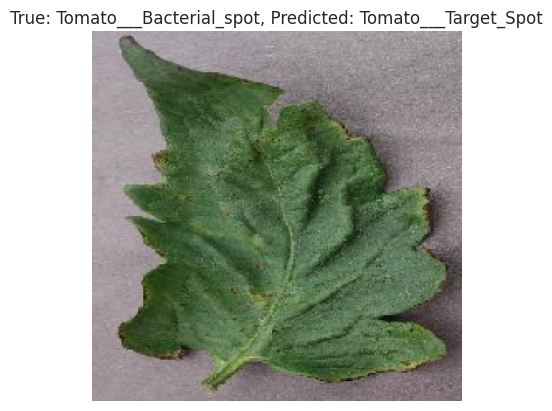

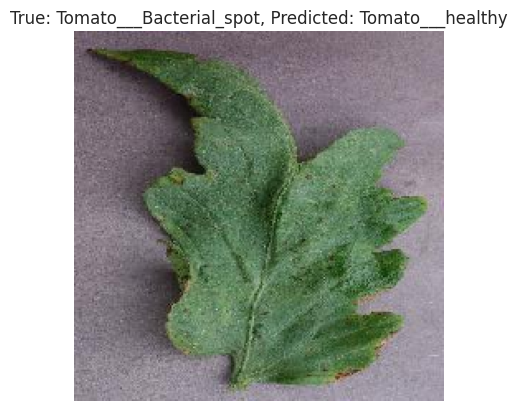

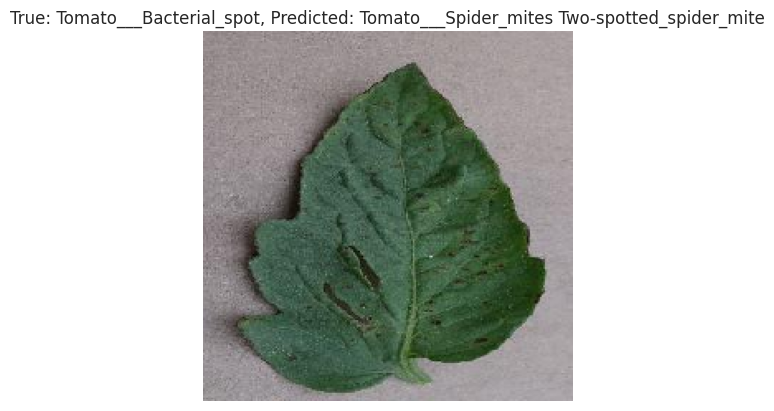

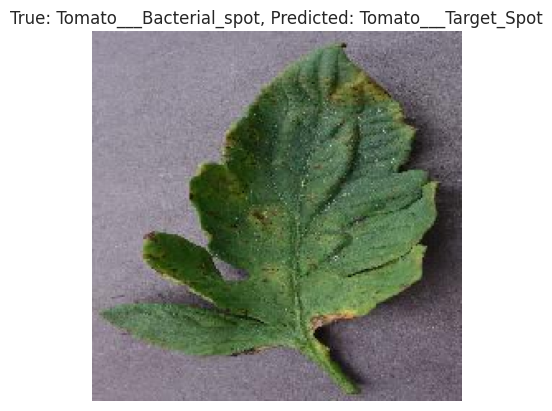

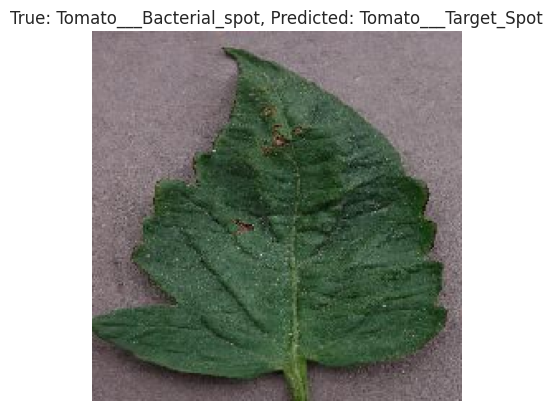

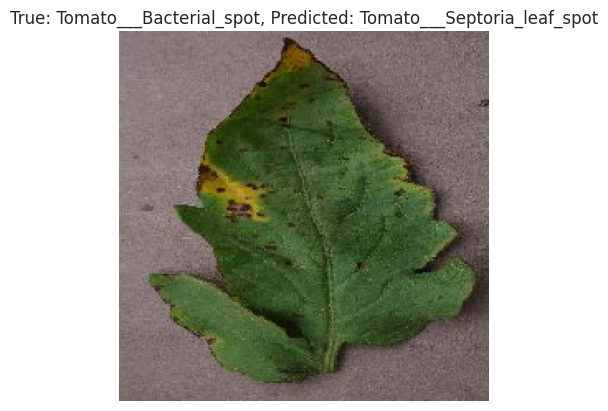

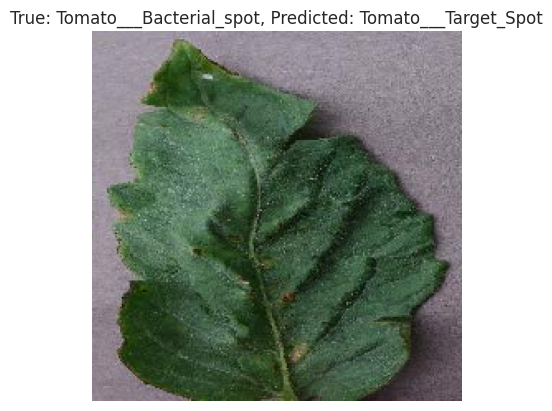

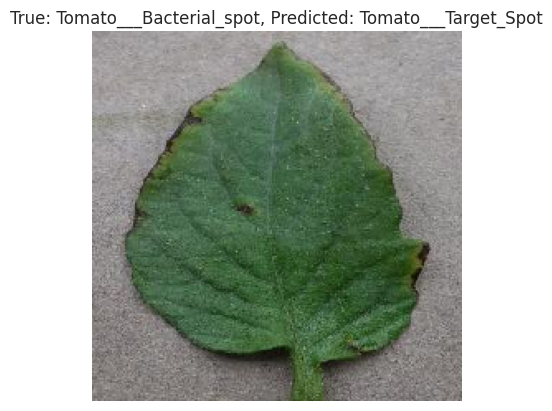

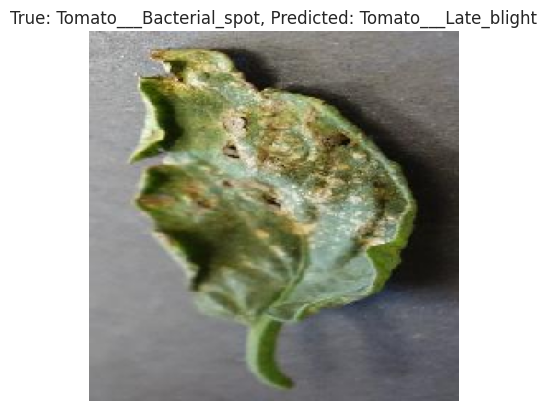

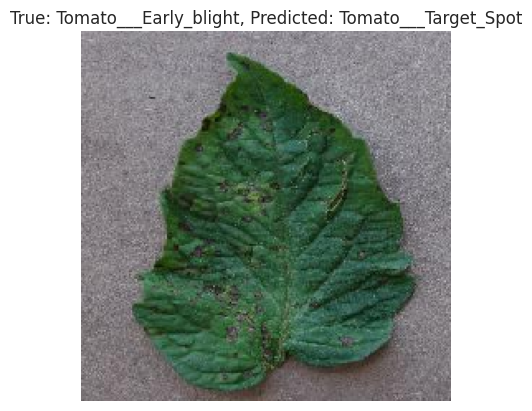

In [102]:
# Results for VGG19 model
plot_misclassified_images(predicted_classes, true_classes, test_gen, class_labels, 'VGG19', num_images=10)

### [VGG19] ROC Curve for Each Class

2024-10-02 15:20:14.329244: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - 9s 267ms/step


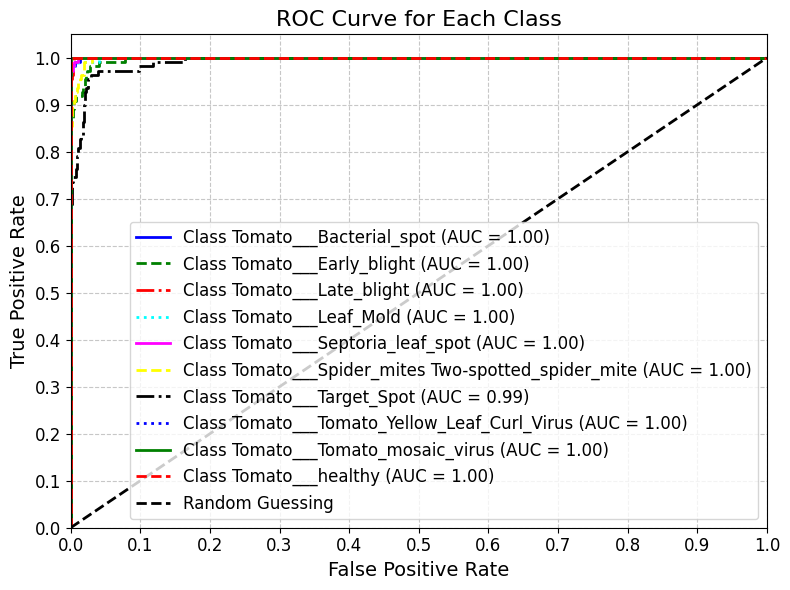

In [9]:
# Results for VGG19 model
plot_roc_curves(true_classes, predictions, class_labels, 'VGG19')

## Further Analysis

### Combine, Save, and Visualize Model Performance Results

The code snippet ahead combines the results of multiple models (CNN, VGG16, and VGG19) into a single dictionary, saves this data to a JSON file, and then visualizes the loss and accuracy comparisons for each model using grouped bar charts.

In [104]:
# Write the training times to a CSV file
with open(f'Training_Times/{split_ratio}/training_times.csv', 'w', newline='') as file:
    writer = csv.writer(file)
    writer.writerow(['Model', 'Training Time'])
    writer.writerow(['CNN', CNN_total_training_time])
    writer.writerow(['VGG16', VGG16_total_training_time])
    writer.writerow(['VGG19', VGG19_total_training_time])

In [105]:
# Combine results into a single dictionary
results = {
    "CNN": cnn_results,
    "VGG16": vgg16_results,
    "VGG19": vgg19_results
}

# Save results to a JSON file
with open(f'Models_Evaluation_Results/{split_ratio}/model_evaluation_results.json', 'w') as f:
    json.dump(results, f, indent=4)

Results from different models (CNN, VGG16, VGG19) are combined into a single dictionary. After that the "parent" dictionary which contains the dictionaries for each of the models, is saved to a JSON file.

In [106]:
# Load results from the JSON file
with open(f'Models_Evaluation_Results/{split_ratio}/model_evaluation_results.json', 'r') as f:
    results = json.load(f)

# Extract data for losses
loss_data = {
    model: [results[model]["train_loss"], results[model]["val_loss"], results[model]["test_loss"]]
    for model in results
}

# Extract data for accuracies
acc_data = {
    model: [results[model]["train_acc"], results[model]["val_acc"], results[model]["test_acc"]]
    for model in results
}

The saved JSON file is loaded back and after that, loss and accuracy data are extracted from the results dictionary for each model and stored in separate dictionaries, loss_data and acc_data.

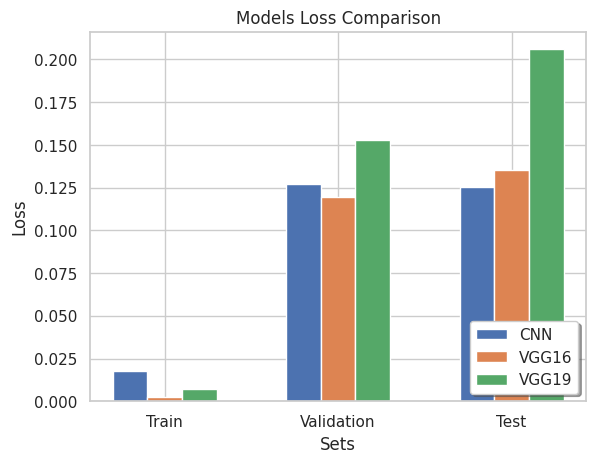

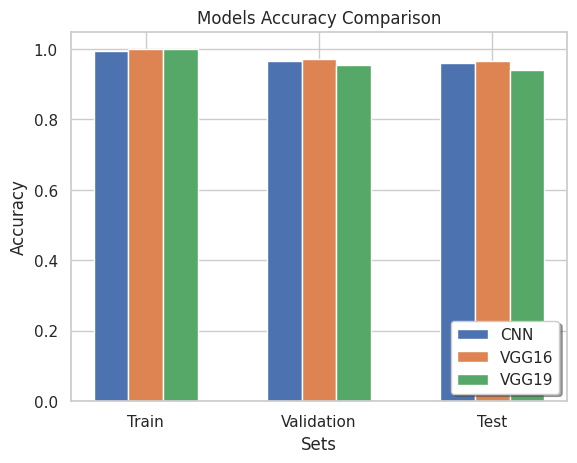

In [107]:
# Function to create grouped bar chart
def plot_grouped_bar_chart(data, ylabel, title, labels):
    models = list(data.keys())
    values = np.array(list(data.values()))
    n_models = len(models)
    n_groups = values.shape[1]

    # Bar width and positions
    bar_width = 0.2
    index = np.arange(n_groups)

    fig, ax = plt.subplots()
    for i, model in enumerate(models):
        ax.bar(index + i * bar_width, values[i], bar_width, label=model)

    ax.set_xlabel('Sets')
    ax.set_ylabel(ylabel)
    ax.set_title(title)
    ax.set_xticks(index + bar_width * (n_models - 1) / 2)
    ax.set_xticklabels(labels)
    ax.legend(loc='lower right', fancybox=True, shadow=True, ncol=1)

    plt.show()

# Labels for the x-axis
labels = ['Train', 'Validation', 'Test']

# Plot for losses
plot_grouped_bar_chart(loss_data, 'Loss', 'Models Loss Comparison', labels)

# Plot for accuracies
plot_grouped_bar_chart(acc_data, 'Accuracy', 'Models Accuracy Comparison', labels)

A function plot_grouped_bar_chart is defined to create grouped bar charts for the provided data. This function is used to plot the loss and accuracy comparisons for the training, validation, and testing sets. Labels for the x-axis are defined as **[`Train`, `Validation`, `Test`]**. The function plot_grouped_bar_chart is called twice: once for plotting the losses and once for plotting the accuracies.

The result is a **`visual comparison`** of the performance (**`loss`** and **`accuracy`**) of the **`CNN`**, **`VGG16`**, and **`VGG19`** models across the **`training`**, **`validation`**, and **`testing`** sets.

### Combined Bar Chart for Test Accuracy and Test Loss of Multiple Models

The following code snippet extracts the test accuracy and test loss for three models (CNN, VGG16, VGG19) from a JSON file and plots a combined bar chart to compare these metrics side by side. The values for each metric are displayed at the top of each bar for clear visualization.

In [108]:
# Load results from the JSON file
with open(f'Models_Evaluation_Results/{split_ratio}/model_evaluation_results.json', 'r') as f:
    results = json.load(f)

The JSON file **`model_evaluation_results.json`** is loaded, and the results are stored in a dictionary named results.

In [109]:
# Extract test accuracy and test loss for each model
test_acc_data = {model: results[model]["test_acc"] for model in results}
test_loss_data = {model: results[model]["test_loss"] for model in results}

Test accuracy and test loss for each model are extracted and stored in **`test_acc_data`** and **`test_loss_data dictionaries`**, respectively.

In [110]:
# Combine the data into a single dictionary for easy plotting
combined_data = {
    "Accuracy": test_acc_data,
    "Loss": test_loss_data
}

The test accuracy and test loss data are combined into a single dictionary **`combined_data`** for easy plotting.

Below the function **`plot_combined_bar_chart`** creates a combined bar chart with the values annotated on top of each bar. The function takes the combined data and the title of the chart as inputs. Bars for test accuracy and test loss are plotted side by side for each model. The plot_combined_bar_chart function is called to generate the combined bar chart. The chart includes bars for both test accuracy and test loss for each model, with the exact values displayed on top of each bar.

In other words, this code snippet generates a single figure with a combined bar chart showing the test accuracy and test loss for the CNN, VGG16, and VGG19 models, allowing for easy comparison of these metrics across different models.

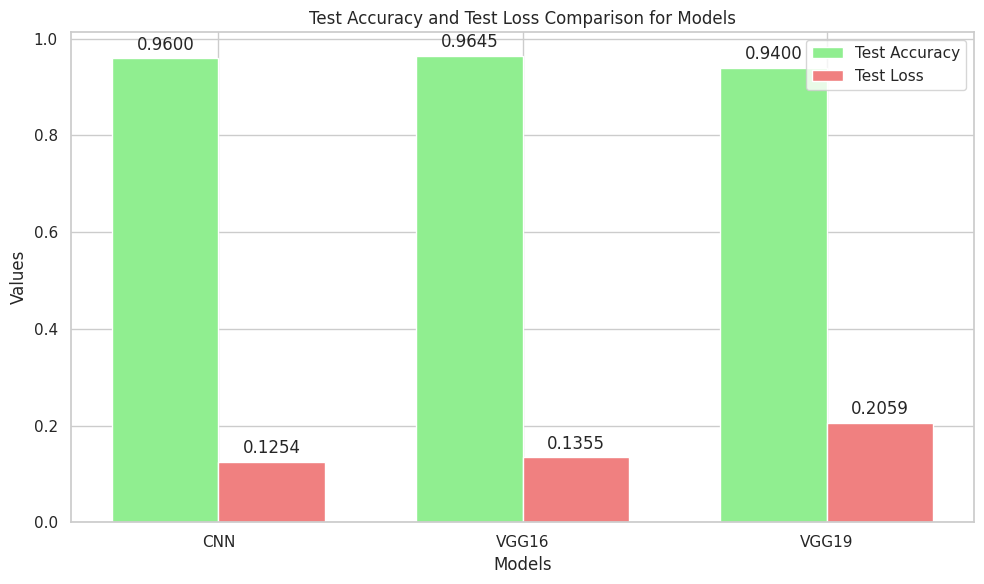

In [111]:
# Function to plot combined bar chart with values annotated on top
def plot_combined_bar_chart(data, title):
    models = list(next(iter(data.values())).keys())
    metrics = list(data.keys())
    values = {metric: list(data[metric].values()) for metric in metrics}
    
    fig, ax = plt.subplots(figsize=(10, 6))
    bar_width = 0.35
    index = np.arange(len(models))

    bars_acc = ax.bar(index - bar_width/2, values["Accuracy"], bar_width, label='Test Accuracy', color='lightgreen')
    bars_loss = ax.bar(index + bar_width/2, values["Loss"], bar_width, label='Test Loss', color='lightcoral')

    ax.set_xlabel('Models')
    ax.set_ylabel('Values')
    ax.set_title(title)
    ax.set_xticks(index)
    ax.set_xticklabels(models)
    ax.legend()

    # Annotating the bars with the values
    def add_labels(bars, value_format):
        for bar in bars:
            height = bar.get_height()
            ax.annotate(f'{value_format % height}',
                        xy=(bar.get_x() + bar.get_width() / 2, height),
                        xytext=(0, 3),  # 3 points vertical offset
                        textcoords="offset points",
                        ha='center', va='bottom')

    add_labels(bars_acc, "%.4f")
    add_labels(bars_loss, "%.4f")

    plt.tight_layout()
    plt.show()

# Plot the combined bar chart for test accuracy and test loss
plot_combined_bar_chart(combined_data, 'Test Accuracy and Test Loss Comparison for Models')

### Loading and Visualizing Model Training Histories for Comparative Analysis

In [127]:
# Load results from the JSON file
with open(f'Models_Training_History/{split_ratio}/training_hist_CNN.json', 'r') as f_CNN:
    CNN_history = json.load(f_CNN)

# Load results from the JSON file
with open(f'Models_Training_History/{split_ratio}/training_hist_VGG16.json', 'r') as f_VGG16:
    VGG16_history = json.load(f_VGG16)

# Load results from the JSON file
with open(f'Models_Training_History/{split_ratio}/training_hist_VGG19.json', 'r') as f_VGG19:
    VGG19_history = json.load(f_VGG19)


models = []
training_times = []

# Read the training times from the CSV file
with open(f'Training_Times/{split_ratio}/training_times.csv', 'r') as file:
    reader = csv.reader(file)
    next(reader)  # Skip the header row
    for row in reader:
        models.append(row[0])
        training_times.append(float(row[1])/60)

### Visualize Training Time for Each Model

This code creates a horizontal bar chart to compare the training times of different machine learning models. Each bar represents a model, and the length of the bar corresponds to the training time in minutes. The chart is color-coded for visual distinction between the models, with labels on the x-axis for training time and the y-axis for the model names. The chart provides a clear visual representation of how long each model took to train, making it easier to compare their training durations.

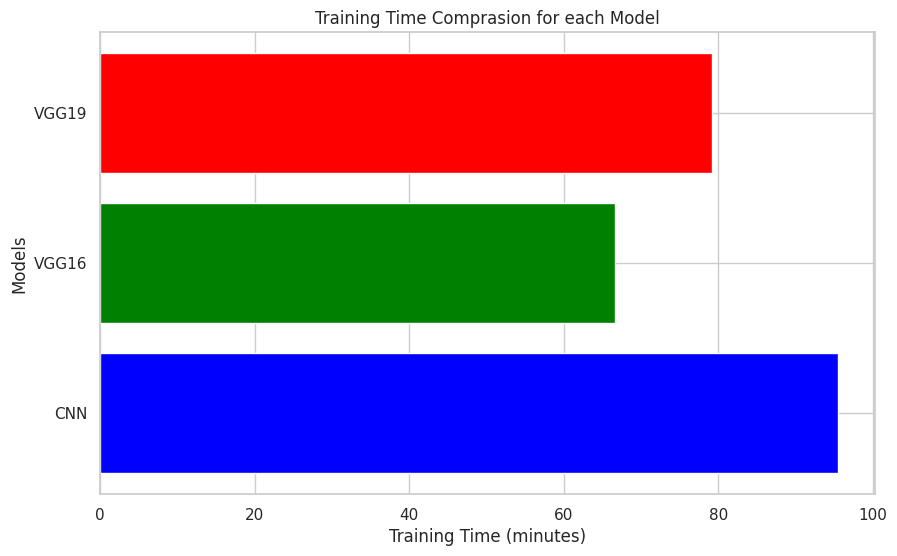

In [128]:
plt.figure(figsize=(10, 6))
plt.barh(models, training_times, color=['blue', 'green', 'red'])
plt.title('Training Time Comprasion for each Model')
plt.xlabel('Training Time (minutes)')
plt.ylabel('Models')
plt.show()

### Radar Chart Comparison of Model Training Times

This code generates a radar (or spider) chart to visually compare the training times of different machine learning models (e.g., CNN, VGG16, VGG19). Each model is represented as a point on the circumference of a circle, and the distance from the center corresponds to the training time of that model.

- **Angles Calculation**: The chart calculates angles evenly spaced around the circle for each model.
- **Completing the Loop**: To form a closed shape, the first training time value is repeated at the end of the list.
- **Plot Initialization**: The chart is initialized in polar coordinates, allowing for the circular arrangement of data.
- **Plotting Data**: The training times are plotted as a line connecting each model, with the area under the line filled in for visual emphasis.
- **Customization**: The y-axis labels are adjusted for better readability, and the plot's limits are set according to the maximum training time.
- **Final Touches**: A title and legend are added to provide context, and the chart is displayed.

This radar chart offers an intuitive way to compare the training times across models, highlighting differences and allowing for quick visual assessments.

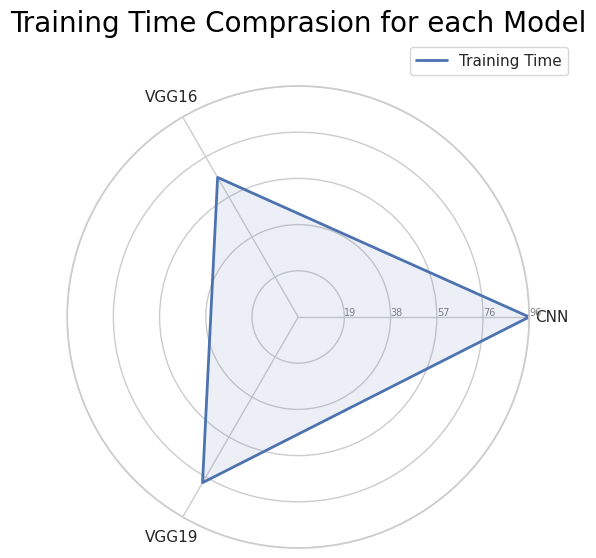

In [129]:
# Number of variables
num_vars = len(models)

# Compute angle for each bar
angles = np.linspace(0, 2 * np.pi, num_vars, endpoint=False).tolist()

# The plot is a circle, so we need to "complete the loop"
training_times += training_times[:1]
angles += angles[:1]

# Initialize the spider plot
fig, ax = plt.subplots(figsize=(6, 6), subplot_kw=dict(polar=True))

# Draw one axe per variable and add labels
plt.xticks(angles[:-1], models)

# Draw y-labels
ax.set_rlabel_position(0)
max_value = max(training_times)
step = max_value / 5
plt.yticks([step * i for i in range(1, 6)], [f"{step * i:.0f}" for i in range(1, 6)], color="grey", size=7)
ax.set_ylim(0, max_value)

# Plot data
ax.plot(angles, training_times, linewidth=2, linestyle='solid', label='Training Time')

# Fill area
ax.fill(angles, training_times, 'b', alpha=0.1)

# Add a title
plt.title('Training Time Comprasion for each Model', size=16, color='black', y=1.1)

# Show the plot
plt.legend(loc='upper right', bbox_to_anchor=(1.1, 1.1))
plt.show()

### Training Loss and Accuracy for Each of CNN, VGG16 and VGG19 Models

The code below creates subplots for the training loss and training accuracy for each of the three models: CNN, VGG16, and VGG19, across epochs. It visualizes the performance of each model during training.

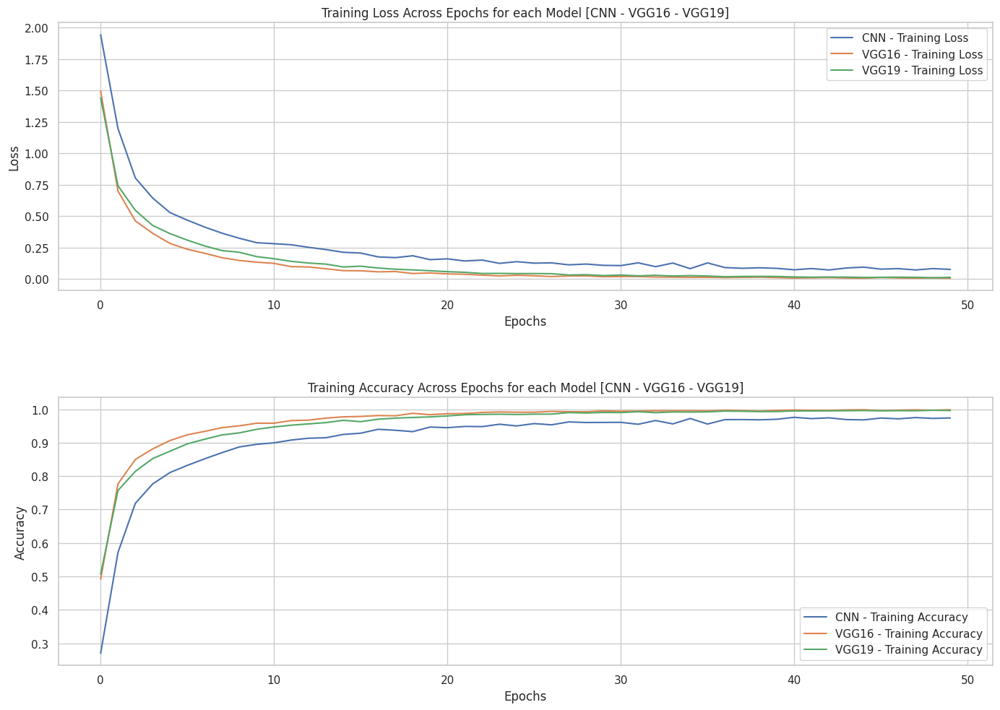

In [130]:
# Create subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))

# Plot loss
ax1.plot(CNN_history['loss'][:50], label='CNN - Training Loss')
ax1.plot(VGG16_history['loss'], label='VGG16 - Training Loss')
ax1.plot(VGG19_history['loss'], label='VGG19 - Training Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.set_title('Training Loss Across Epochs for each Model [CNN - VGG16 - VGG19]')
ax1.legend()
ax1.grid(True)

# Plot accuracy
ax2.plot(CNN_history['accuracy'][:50], label='CNN - Training Accuracy')
ax2.plot(VGG16_history['accuracy'], label='VGG16 - Training Accuracy')
ax2.plot(VGG19_history['accuracy'], label='VGG19 - Training Accuracy')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.set_title('Training Accuracy Across Epochs for each Model [CNN - VGG16 - VGG19]')
ax2.legend()
ax2.grid(True)

# Adjust layout and add space between the plots
plt.tight_layout()
plt.subplots_adjust(hspace=0.4)

# Display the plots
plt.show()

### Validation Loss and Accuracy for Each of CNN, VGG16 and VGG19 Models

The following code creates subplots for the validation loss and validation accuracy for each of the three models: CNN, VGG16, and VGG19, across epochs. It helps in evaluating the models' performance on the validation data.

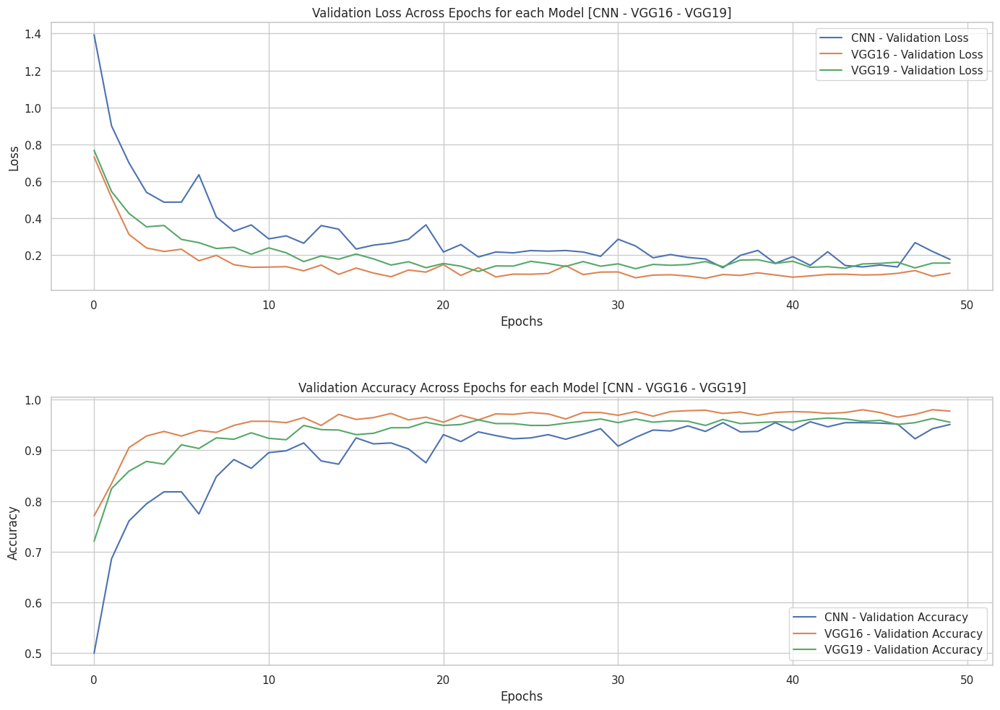

In [131]:
# Create subplots
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))

# Plot loss
ax1.plot(CNN_history['val_loss'][:50], label='CNN - Validation Loss')
ax1.plot(VGG16_history['val_loss'], label='VGG16 - Validation Loss')
ax1.plot(VGG19_history['val_loss'], label='VGG19 - Validation Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.set_title('Validation Loss Across Epochs for each Model [CNN - VGG16 - VGG19]')
ax1.legend()
ax1.grid(True)

# Plot accuracy
ax2.plot(CNN_history['val_accuracy'][:50], label='CNN - Validation Accuracy')
ax2.plot(VGG16_history['val_accuracy'], label='VGG16 - Validation Accuracy')
ax2.plot(VGG19_history['val_accuracy'], label='VGG19 - Validation Accuracy')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.set_title('Validation Accuracy Across Epochs for each Model [CNN - VGG16 - VGG19]')
ax2.legend()
ax2.grid(True)

# Adjust layout and add space between the plots
plt.tight_layout()
plt.subplots_adjust(hspace=0.4)

# Display the plots
plt.show()

### Training and Validation Loss and Accuracy for Each of CNN, VGG16 and VGG19 Models

Below the code creates subplots for both training and validation loss and accuracy for each of the three models: CNN, VGG16, and VGG19, across epochs. It provides a comprehensive view of the models' performance during training and validation.

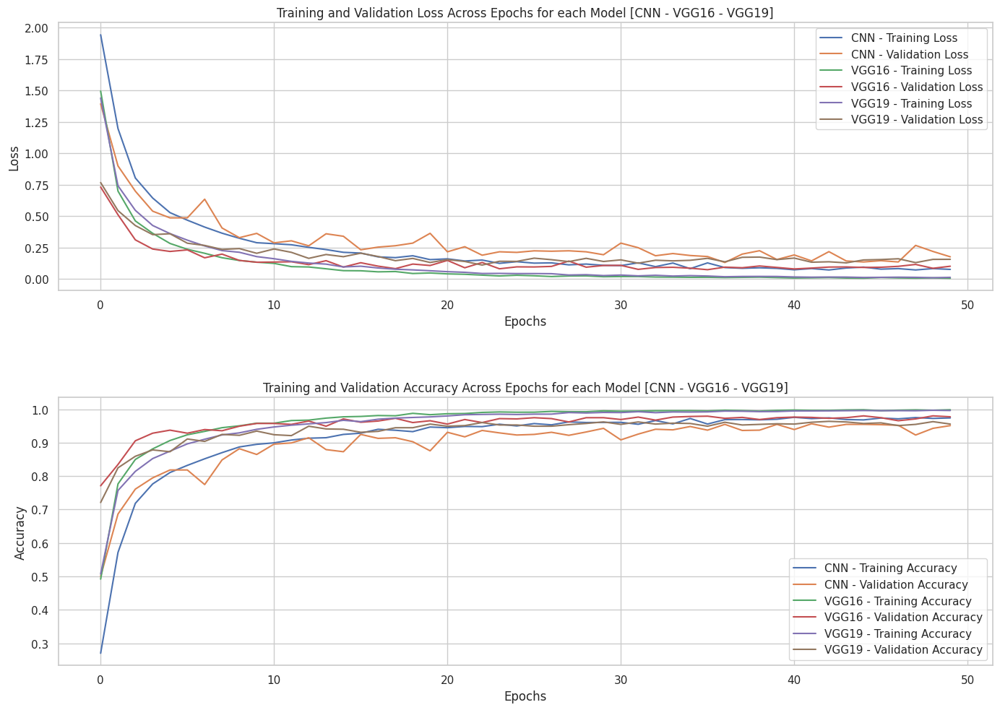

In [ ]:
fig, (ax1, ax2) = plt.subplots(2, 1, figsize=(14, 10))

# Plot loss
ax1.plot(CNN_history['loss'][:50], label='CNN - Training Loss')
ax1.plot(CNN_history['val_loss'][:50], label='CNN - Validation Loss')
ax1.plot(VGG16_history['loss'], label='VGG16 - Training Loss')
ax1.plot(VGG16_history['val_loss'], label='VGG16 - Validation Loss')
ax1.plot(VGG19_history['loss'], label='VGG19 - Training Loss')
ax1.plot(VGG19_history['val_loss'], label='VGG19 - Validation Loss')
ax1.set_xlabel('Epochs')
ax1.set_ylabel('Loss')
ax1.set_title('Training and Validation Loss Across Epochs for each Model [CNN - VGG16 - VGG19]')
ax1.legend()
ax1.grid(True)

# Plot accuracy
ax2.plot(CNN_history['accuracy'][:50], label='CNN - Training Accuracy')
ax2.plot(CNN_history['val_accuracy'][:50], label='CNN - Validation Accuracy')
ax2.plot(VGG16_history['accuracy'], label='VGG16 - Training Accuracy')
ax2.plot(VGG16_history['val_accuracy'], label='VGG16 - Validation Accuracy')
ax2.plot(VGG19_history['accuracy'], label='VGG19 - Training Accuracy')
ax2.plot(VGG19_history['val_accuracy'], label='VGG19 - Validation Accuracy')
ax2.set_xlabel('Epochs')
ax2.set_ylabel('Accuracy')
ax2.set_title('Training and Validation Accuracy Across Epochs for each Model [CNN - VGG16 - VGG19]')
ax2.legend()
ax2.grid(True)

# Adjust layout and add space between the plots
plt.tight_layout()
plt.subplots_adjust(hspace=0.4)

# Display the plots
plt.show()

### Combined Training and Validation Metrics for Each of CNN, VGG16 and VGG19 Models

The following code snippet plots both training and validation loss and accuracy for each of the three models: CNN, VGG16, and VGG19, in a single plot. It offers a unified view of all metrics to facilitate comparison.

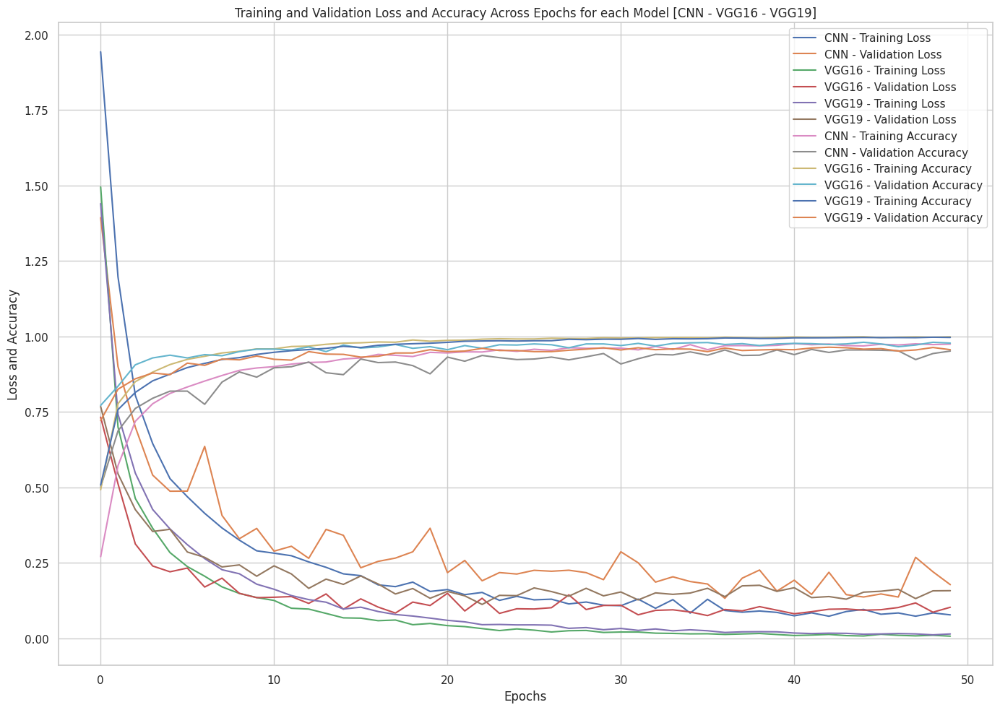

In [ ]:
# Plot the loss and accuracy
plt.figure(figsize=(14, 10))
plt.plot(CNN_history['loss'][:50], label='CNN - Training Loss')
plt.plot(CNN_history['val_loss'][:50], label='CNN - Validation Loss')
plt.plot(VGG16_history['loss'], label='VGG16 - Training Loss')
plt.plot(VGG16_history['val_loss'], label='VGG16 - Validation Loss')
plt.plot(VGG19_history['loss'], label='VGG19 - Training Loss')
plt.plot(VGG19_history['val_loss'], label='VGG19 - Validation Loss')
plt.plot(CNN_history['accuracy'][:50], label='CNN - Training Accuracy')
plt.plot(CNN_history['val_accuracy'][:50], label='CNN - Validation Accuracy')
plt.plot(VGG16_history['accuracy'], label='VGG16 - Training Accuracy')
plt.plot(VGG16_history['val_accuracy'], label='VGG16 - Validation Accuracy')
plt.plot(VGG19_history['accuracy'], label='VGG19 - Training Accuracy')
plt.plot(VGG19_history['val_accuracy'], label='VGG19 - Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Loss and Accuracy')
plt.title('Training and Validation Loss and Accuracy Across Epochs for each Model [CNN - VGG16 - VGG19]')
plt.legend()
plt.grid(True)

plt.tight_layout()
plt.show()

### Loading Model Evaluation Results from Different Training Splits

In [134]:
import json

# Paths to the JSON files
file_70_12_12 = "Models_Evaluation_Results/70-15-15/model_evaluation_results.json"
file_80_10_10 = f"Models_Evaluation_Results/{split_ratio}/model_evaluation_results.json"

# Load the JSON data
with open(file_70_12_12, 'r') as f:
    data_70_12_12 = json.load(f)

with open(file_80_10_10, 'r') as f:
    data_80_10_10 = json.load(f)

### Comparative Analysis of Model Performance Across Different Data Splits

The overall code is designed to compare the performance of different machine learning models (e.g., CNN, VGG16, VGG19) trained and evaluated on datasets split differently (e.g., 70-15-15 vs. 80-10-10).

First, it loads evaluation metrics (like training loss, validation accuracy, etc.) from two different JSON files corresponding to these splits. Then, it organizes this data into a structured format, enabling easy comparison of metrics between the two splits. Finally, the code generates bar plots for each model, illustrating how the performance metrics differ between the two training scenarios, with annotations indicating the exact values on the bars. This approach helps in visually assessing the impact of different data splits on model performance.

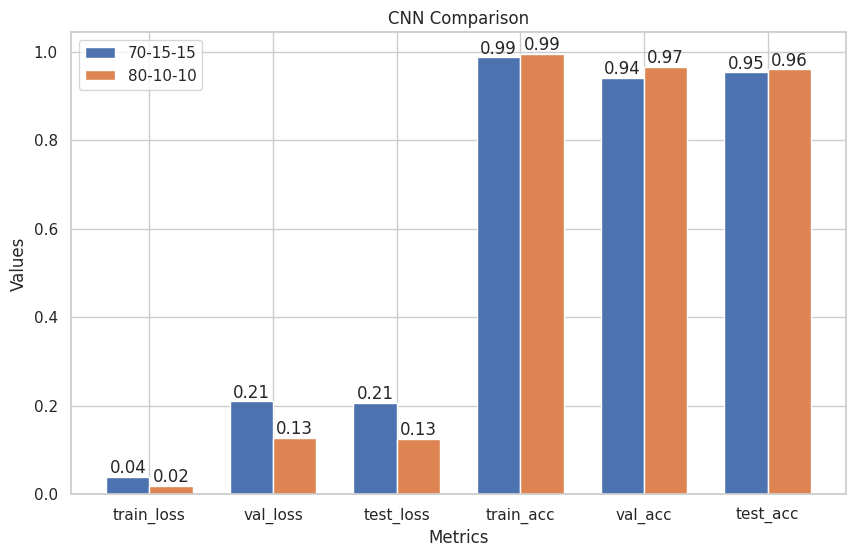

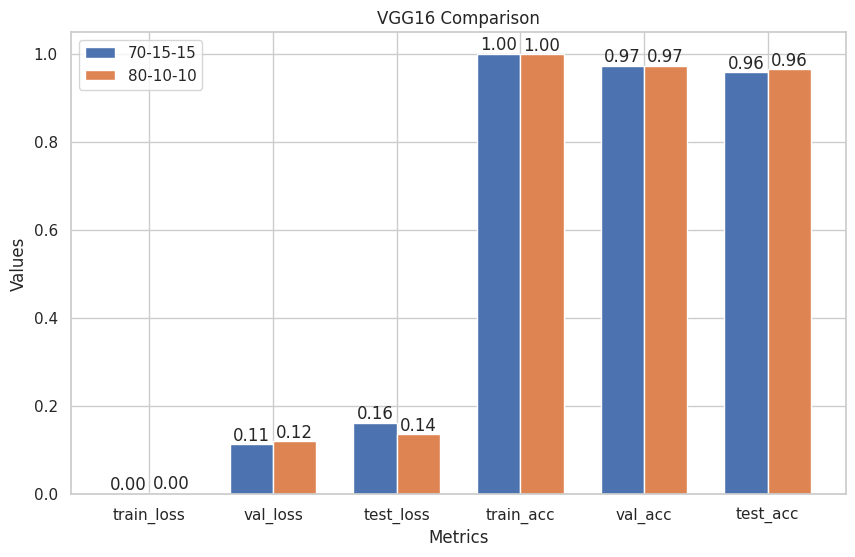

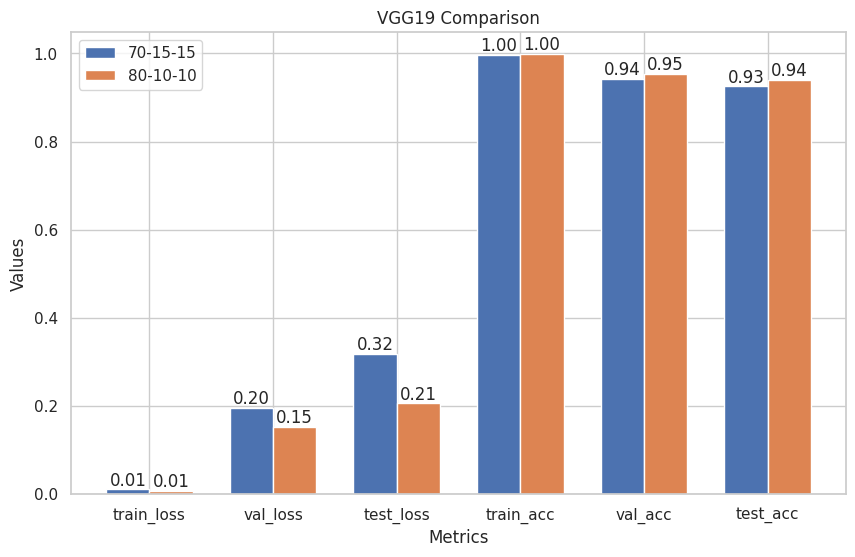

In [135]:
import pandas as pd

def prepare_comparison_data(data1, data2):
    metrics = ["train_loss", "val_loss", "test_loss", "train_acc", "val_acc", "test_acc"]
    models = ["CNN", "VGG16", "VGG19"]
    comparison_data = []

    for model in models:
        for metric in metrics:
            comparison_data.append({
                "Model": model,
                "Metric": metric,
                "70-15-15": data1[model][metric],
                "80-10-10": data2[model][metric]
            })

    return pd.DataFrame(comparison_data)

comparison_df = prepare_comparison_data(data_70_12_12, data_80_10_10)

import matplotlib.pyplot as plt

# Plot comparison with value annotations
def plot_comparison(df):
    models = df["Model"].unique()
    metrics = df["Metric"].unique()

    for model in models:
        model_data = df[df["Model"] == model]
        fig, ax = plt.subplots(figsize=(10, 6))
        width = 0.35

        x = range(len(metrics))
        bars1 = ax.bar(x, model_data["70-15-15"], width, label='70-15-15')
        bars2 = ax.bar([p + width for p in x], model_data["80-10-10"], width, label='80-10-10')

        # Add values on top of bars
        for bar in bars1:
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.2f}', ha='center', va='bottom')
        for bar in bars2:
            yval = bar.get_height()
            ax.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.2f}', ha='center', va='bottom')

        ax.set_xlabel('Metrics')
        ax.set_ylabel('Values')
        ax.set_title(f'{model} Comparison')
        ax.set_xticks([p + width / 2 for p in x])
        ax.set_xticklabels(metrics)
        ax.legend()

        plt.show()

plot_comparison(comparison_df)


### Comparing Training Times Across Different Data Splits for Machine Learning Models

This code snippet focuses on analyzing and comparing the training times of different machine learning models (such as CNN, VGG16, and VGG19) trained on datasets with two different splits (70-15-15 and 80-10-10).

First, the code loads training time data from CSV files corresponding to each data split. It then organizes the training times into a structured DataFrame, converting the times into minutes for easier comparison. Finally, the code generates a bar plot to visually compare the training times of each model between the two dataset splits, with the exact training times annotated on top of the bars. This visualization helps in understanding the impact of different data splits on the computational cost of training these models.

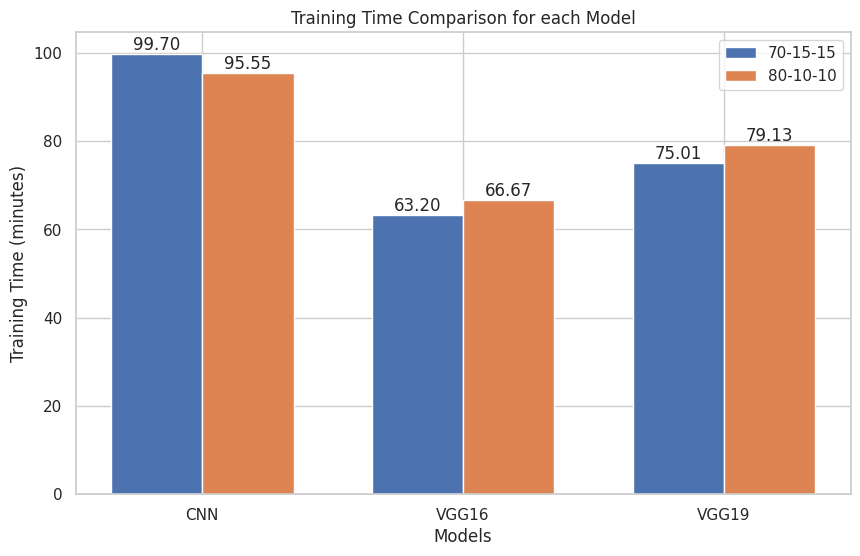

In [139]:
import pandas as pd
import matplotlib.pyplot as plt

# Paths to the CSV files
csv_70_15_15 = "Training_Times/70-15-15/training_times.csv"
csv_80_10_10 = f"Training_Times/{split_ratio}/training_times.csv"

# Load the CSV files into DataFrames
training_times_70_15_15 = pd.read_csv(csv_70_15_15)
training_times_80_10_10 = pd.read_csv(csv_80_10_10)

def prepare_training_time_data(times1, times2):
    models = ["CNN", "VGG16", "VGG19"]
    training_time_data = []

    for model in models:
        training_time_70_15_15 = times1[times1["Model"] == model]["Training Time"].values[0] / 60
        training_time_80_10_10 = times2[times2["Model"] == model]["Training Time"].values[0] / 60
        training_time_data.append({
            "Model": model,
            "70-15-15": training_time_70_15_15,
            "80-10-10": training_time_80_10_10
        })

    return pd.DataFrame(training_time_data)

# Prepare the training time data
training_time_df = prepare_training_time_data(training_times_70_15_15, training_times_80_10_10)

def plot_training_times(df):
    models = df["Model"]
    times_70_15_15 = df["70-15-15"]
    times_80_10_10 = df["80-10-10"]

    fig, ax = plt.subplots(figsize=(10, 6))
    width = 0.35
    x = range(len(models))

    bars1 = ax.bar(x, times_70_15_15, width, label='70-15-15')
    bars2 = ax.bar([p + width for p in x], times_80_10_10, width, label='80-10-10')

    # Add values on top of bars
    for bar in bars1:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.2f}', ha='center', va='bottom')
    for bar in bars2:
        yval = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2.0, yval, f'{yval:.2f}', ha='center', va='bottom')

    ax.set_xlabel('Models')
    ax.set_ylabel('Training Time (minutes)')
    ax.set_title('Training Time Comparison for each Model')
    ax.set_xticks([p + width / 2 for p in x])
    ax.set_xticklabels(models)
    ax.legend()

    plt.show()

# Plot training times comparison
plot_training_times(training_time_df)

### Model Ensemble (this makes sense when the three models are trained/built)

The code implements an ensemble classification strategy by combining the predictions of three models (CNN, VGG16, and VGG19) using majority voting. The final predictions, which reflect the most common class predicted by the three models for each sample, are then evaluated using standard classification metrics. This approach leverages the strengths of multiple models to potentially improve classification performance.

In [122]:
from sklearn.ensemble import VotingClassifier

def get_model_predictions(model, test_data):
    predictions = model.predict(test_data)
    predicted_classes = np.argmax(predictions, axis=1)
    return predicted_classes

cnn_predictions = get_model_predictions(cnn, test_gen)
vgg16_predictions = get_model_predictions(VGG16_model, test_gen)
vgg19_predictions = get_model_predictions(VGG19_model, test_gen)

# Majority voting
final_predictions = np.array([np.bincount([cnn_predictions[i], vgg16_predictions[i], vgg19_predictions[i]]).argmax() for i in range(len(cnn_predictions))])

print(classification_report(true_classes, final_predictions, target_names=class_labels))

 3/35 [=>............................] - ETA: 1s

2024-08-11 12:47:23.767830: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


 1/35 [..............................] - ETA: 2s

2024-08-11 12:47:24.974667: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


 1/35 [..............................] - ETA: 2s

2024-08-11 12:47:32.561059: I tensorflow/core/common_runtime/executor.cc:1197] [/device:CPU:0] (DEBUG INFO) Executor start aborting (this does not indicate an error and you can ignore this message): INVALID_ARGUMENT: You must feed a value for placeholder tensor 'Placeholder/_0' with dtype int32
	 [[{{node Placeholder/_0}}]]


35/35 [==============================] - 9s 263ms/step
                                               precision    recall  f1-score   support

                      Tomato___Bacterial_spot       1.00      0.98      0.99       110
                        Tomato___Early_blight       0.95      0.95      0.95       110
                         Tomato___Late_blight       0.97      0.99      0.98       110
                           Tomato___Leaf_Mold       0.99      0.98      0.99       110
                  Tomato___Septoria_leaf_spot       0.96      0.99      0.98       110
Tomato___Spider_mites Two-spotted_spider_mite       0.99      0.98      0.99       110
                         Tomato___Target_Spot       0.96      0.94      0.95       110
       Tomato___Tomato_Yellow_Leaf_Curl_Virus       0.99      1.00      1.00       110
                 Tomato___Tomato_mosaic_virus       1.00      1.00      1.00       110
                             Tomato___healthy       0.99      1.00      1.